# INF2178 Midterm - Group 15
Xinxuan Lin, Peggy Pu

Note: The plots may not able to display on Github, but can be seen on google colab platform.

https://colab.research.google.com/drive/15CehIs6GpmbLmq2oeijhz2ZhwyfeBHmb?usp=sharing

In [1]:
# load the packages
import pandas as pd
import numpy as np

import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt

from scipy import stats
import statsmodels
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.formula.api import ols
from statsmodels.discrete.discrete_model import Logit

from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.stats.multicomp as mc

from statsmodels.stats.power import TTestIndPower
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import statsmodels.formula.api as smf
from sklearn.metrics import confusion_matrix, accuracy_score
import statsmodels.tools as tools

np.set_printoptions(formatter={'float': lambda x: "{:.4f}".format(x)})
pd.options.display.float_format = "{:.4f}".format
from scipy.stats import t
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.display.max_columns = None #show all columns in data



## Data Cleaning 

In [2]:
# import dataset
arr = pd.read_csv('/content/sample_data/Arrests_and_Strip_Searches_(RBDC-ARR-TBL-001).csv')

In [3]:
# extract the needed attributes: PersonID, StripSearch, Perceived_Race, Youth Status, age group, negetive action, Sex, booked
df_eda = arr.loc[:,["PersonID", "Perceived_Race", "Sex", 
                    "Age_group__at_arrest_",'Youth_at_arrest__under_18_years',
                   'Actions_at_arrest___Concealed_i','Actions_at_arrest___Combative__',
                   'Actions_at_arrest___Resisted__d','Actions_at_arrest___Mental_inst',
                   'Actions_at_arrest___Assaulted_o',"StripSearch"]]

# Replace the na value in Perceived Race to "Unknown or Legacy"
df_eda.Perceived_Race = df_eda.Perceived_Race.fillna('Unknown or Legacy')


In [4]:
# change the Youth category name into binary
df_eda = df_eda.replace(['Youth (aged 17 and younger)','Youth (aged 17 years and under)'], 'Youth')

# Change the 17- age level name
df_eda = df_eda.replace(['Aged 17 years and younger'], 'Aged 17 years and under')
df_eda = df_eda.replace(['Aged 65 and older'], 'Aged 65 years and older')


In [5]:
# sum up action at arrest as new variable: Negative action
df_eda['Negative Action'] = df_eda.iloc[:,-5:-1].sum(axis=1)


In [6]:
# drop na in age group at arrest
df_edanna = df_eda[df_eda['Age_group__at_arrest_'].notna()]

In [7]:
# drop action at arrest columns
df_edanna = df_edanna.drop(df_edanna.columns[[-7,-6,-5,-4,-3]], axis=1)

In [8]:
# Group the rows based on the ID, race and sex and count the arrest time
df_count =  df_edanna.groupby(['PersonID','Perceived_Race','Sex'], as_index=False).count()

# Rename the StripSearch column
df_count = df_count.rename(columns={'StripSearch': 'Total Arrest'})

# Drop column age group, youth
df_count = df_count.drop(df_count.columns[[-4,-3,-1]], axis=1)

df_count.head(31)

,PersonID,Perceived_Race,Sex,Total Arrest
0,300000,East/Southeast Asian,M,1
1,300001,White,F,1
2,300002,White,M,1
3,300003,White,M,8
4,300004,Black,M,1
5,300005,South Asian,M,1
6,300006,Middle-Eastern,M,2
7,300007,South Asian,M,8
8,300008,Black,M,1
9,300009,White,M,1


In [9]:
# Duplicate the strip search column to calculate the average later.
df_edanna['StripSearchPercentage'] = df_edanna.loc[:, 'StripSearch']

# Group row with same ID, age group, youth status
df_ay =df_edanna.groupby(['PersonID','Age_group__at_arrest_','Youth_at_arrest__under_18_years'], as_index=False).agg({'StripSearchPercentage':'mean'})

# multiple percentage column by 100
df_ay['StripSearchPercentage'] = df_ay['StripSearchPercentage'].multiply(100)



In [10]:
# Since some observations have more than one age group, to avoid misleading info, these duplicated obs are deleted.
# Get duplicate rows with the same person ID
df_dupage = df_ay[df_ay.duplicated('PersonID')]
# get the list of Person ID that have more than one observation.
dupidag = df_dupage['PersonID'].unique() # 852 people have non unique age group categories.
# remove the duplicate rows
df_dpag = df_ay[~(df_ay['PersonID'].isin(dupidag))] # remove 1743 cases.

# Glimpse the dataset
df_dpag.head(31)

,PersonID,Age_group__at_arrest_,Youth_at_arrest__under_18_years,StripSearchPercentage
0,300000,Aged 35 to 44 years,Not a youth,0.0000
1,300001,Aged 17 years and under,Youth,0.0000
2,300002,Aged 35 to 44 years,Not a youth,0.0000
5,300004,Aged 25 to 34 years,Not a youth,0.0000
6,300005,Aged 45 to 54 years,Not a youth,0.0000
7,300006,Aged 55 to 64 years,Not a youth,0.0000
8,300007,Aged 25 to 34 years,Not a youth,12.5000
9,300008,Aged 25 to 34 years,Not a youth,0.0000
10,300009,Aged 35 to 44 years,Not a youth,0.0000
11,300010,Aged 45 to 54 years,Not a youth,0.0000


In [11]:
# Duplicate the strip search column to calculate the average later.
df_edanna['StripSearchPercentage'] = df_edanna.loc[:, 'StripSearch']

df_gp =  df_edanna.groupby(['PersonID','Perceived_Race','Sex'], as_index=False).agg({'Negative Action':'sum',
                                                                                     'StripSearch':'sum', 
                                                                                  'StripSearchPercentage':'mean'})
# transform the percentage column into % values
df_gp['StripSearchPercentage'] = df_gp['StripSearchPercentage'].multiply(100)
# glimpse the dataset
df_gp.head(31)

,PersonID,Perceived_Race,Sex,Negative Action,StripSearch,StripSearchPercentage
0,300000,East/Southeast Asian,M,0,0,0.0000
1,300001,White,F,0,0,0.0000
2,300002,White,M,0,0,0.0000
3,300003,White,M,1,1,12.5000
4,300004,Black,M,0,0,0.0000
5,300005,South Asian,M,0,0,0.0000
6,300006,Middle-Eastern,M,2,0,0.0000
7,300007,South Asian,M,0,1,12.5000
8,300008,Black,M,0,0,0.0000
9,300009,White,M,0,0,0.0000


In [12]:
# Since some observations have more than one preceived race, to avoid misleading info, these duplicated obs are deleted.
# Get duplicate rows with the same person ID
df_dup = df_gp[df_gp.duplicated('PersonID')]
# get the list of Person ID that have more than one observation.
dupid = df_dup['PersonID'].unique() # 2675 people have non unique perceived race categories.
# remove the duplicate rows
df_dp = df_gp[~(df_gp['PersonID'].isin(dupid))] # remove 5753 cases.
# contains 34653 cases.

# Glimpse the dataset
df_dp.head(31)

,PersonID,Perceived_Race,Sex,Negative Action,StripSearch,StripSearchPercentage
0,300000,East/Southeast Asian,M,0,0,0.0000
1,300001,White,F,0,0,0.0000
2,300002,White,M,0,0,0.0000
3,300003,White,M,1,1,12.5000
4,300004,Black,M,0,0,0.0000
5,300005,South Asian,M,0,0,0.0000
6,300006,Middle-Eastern,M,2,0,0.0000
7,300007,South Asian,M,0,1,12.5000
8,300008,Black,M,0,0,0.0000
9,300009,White,M,0,0,0.0000


In [13]:
# merge the total arrest column from df_count to df_fin 
df_fin = pd.merge(df_dp, df_count, how="left", on=["PersonID", "Perceived_Race", "Sex"])


In [14]:
# Rearrage the order of columns
df_fin = df_fin[['PersonID',
                 'Perceived_Race',
                 'Sex',
                 'Negative Action',
                 'StripSearch',
                 'Total Arrest',
                 'StripSearchPercentage']]

# Since for U sex, there's only 3 cases, which is representative enough, these three cases are removed
df_fin = df_fin[df_fin.Sex != 'U']
# Glimpse the dataset
df_fin.head(31)

,PersonID,Perceived_Race,Sex,Negative Action,StripSearch,Total Arrest,StripSearchPercentage
0,300000,East/Southeast Asian,M,0,0,1,0.0000
1,300001,White,F,0,0,1,0.0000
2,300002,White,M,0,0,1,0.0000
3,300003,White,M,1,1,8,12.5000
4,300004,Black,M,0,0,1,0.0000
5,300005,South Asian,M,0,0,1,0.0000
6,300006,Middle-Eastern,M,2,0,2,0.0000
7,300007,South Asian,M,0,1,8,12.5000
8,300008,Black,M,0,0,1,0.0000
9,300009,White,M,0,0,1,0.0000


## EDA

### Descriptive Statistics

In [15]:
# separate the dataset based on sex
male = df_fin[(df_fin['Sex'] == 'M')]
female = df_fin[(df_fin['Sex'] == 'F')]

In [16]:
fig = go.Figure()
fig.add_trace(go.Histogram(
    x=male['Perceived_Race'],
    histnorm='density',
    name='Male', 
    marker_color='#415e97',
    opacity=0.75
))

fig.add_trace(go.Histogram(
    x=female['Perceived_Race'],
    histnorm='density',
    name='Female',
    marker_color='#da8f1b',
    opacity=0.75
))


fig.update_layout(
    title_text='<b>Number of female and male being arrested</b>', 
    xaxis_title_text='Perceived Race', 
    yaxis_title_text='Count', 
    bargap=0.2, 
    bargroupgap=0.1,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99),
        width=800, height=600 
)

fig.show()

In [17]:
# Group the rows with same race and sex
gp_race = df_fin.groupby(['Perceived_Race','Sex'], as_index=False).agg({'StripSearch':'sum',
                                                                       'Total Arrest':'sum'})

In [18]:
# Calculate the percentage of strip search in each group of race and sex
gp_race["StripSearchPercentage"] = gp_race['StripSearch']/gp_race['Total Arrest']*100  

# Glimpse the dataset
gp_race.head(20)

,Perceived_Race,Sex,StripSearch,Total Arrest,StripSearchPercentage
0,Black,F,201,2610,7.7011
1,Black,M,1834,12902,14.2149
2,East/Southeast Asian,F,13,614,2.1173
3,East/Southeast Asian,M,180,2720,6.6176
4,Indigenous,F,31,382,8.1152
5,Indigenous,M,80,643,12.4417
6,Latino,F,6,197,3.0457
7,Latino,M,58,1036,5.5985
8,Middle-Eastern,F,5,277,1.8051
9,Middle-Eastern,M,100,1936,5.1653


In [19]:
# Bar plot for count total arrest for different races across the sex categories.
fig = px.bar(gp_race, x='Perceived_Race', y = 'Total Arrest',
             color = "Sex", barmode='group',
             color_discrete_sequence= ['#003F5C','#86BCB6'],
             category_orders = {"Perceived_Race": ["White", "Black", 
                                                   "East/Southeast Asian",
                                                   "Unknown or Legacy",
                                                   "South Asian","Middle-Eastern",
                                                   "Latino","Indigenous"],
                                "Sex": ["M","F"]},
             width=700, height=600)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b>Average of Total arrest in various Perceived Race</b>',
                  yaxis_title = "Average Number of arrest",
                  xaxis_title = "Perceived Race",
                  legend=dict(
                      yanchor="top",
                      y=0.99,
                      xanchor="right",
                      x=0.99)
                  
)

# Show plot
fig.show()

In [20]:
# Bar plot for Perceived Race
fig = px.bar(gp_race, x='Perceived_Race', y = 'StripSearchPercentage',
             color = "Sex", barmode='group',
             color_discrete_sequence= ['#003F5C','#86BCB6'],
             category_orders = {"Perceived_Race": ["White", "Black", 
                                                   "East/Southeast Asian",
                                                   "Unknown or Legacy",
                                                   "South Asian","Middle-Eastern",
                                                   "Latino","Indigenous"],
                                "Sex": ["M","F"]},
             width=700, height=600)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b>Percentage of Mean Strip Searches in various Perceived Race</b>',
                  yaxis_title = "Percentage of Mean Strip Searches",
                  xaxis_title = "Perceived Race"
                  
)

# Show plot
fig.show()

In [21]:
# view the data statistics
df_fin.groupby(['Perceived_Race','Sex'])['StripSearchPercentage'].describe()

count    mean     std    min    25%    50%  \
Perceived_Race       Sex                                                   
Black                F    1791.0000  6.4414 22.7371 0.0000 0.0000 0.0000   
                     M    7747.0000 11.4859 28.6652 0.0000 0.0000 0.0000   
East/Southeast Asian F     565.0000  1.8053 13.2193 0.0000 0.0000 0.0000   
                     M    2278.0000  5.1456 20.8422 0.0000 0.0000 0.0000   
Indigenous           F     214.0000  7.6324 24.8748 0.0000 0.0000 0.0000   
                     M     328.0000 10.0030 25.6865 0.0000 0.0000 0.0000   
Latino               F     164.0000  2.2358 13.2518 0.0000 0.0000 0.0000   
                     M     846.0000  4.8286 20.3403 0.0000 0.0000 0.0000   
Middle-Eastern       F     244.0000  1.8443 13.0951 0.0000 0.0000 0.0000   
                     M    1600.0000  4.4632 19.4804 0.0000 0.0000 0.0000   
South Asian          F     361.0000  2.0776 14.0378 0.0000 0.0000 0.0000   
                     M    1841.0000  4.7712 20.3268 0.0000 0.0000 0.0000   
Unknown or Legacy    F     558.0000  3.9427 19.2464 0.0000 0.0000 0.0000   
                     M    2276.0000  5.9283 22.9046 0.0000 0.0000 0.0000   
White                F    3319.0000  8.4539 24.7619 0.0000 0.0000 0.0000   
                     M   10518.0000  8.4136 24.2651 0.0000 0.0000 0.0000   

                            75%      max  
Perceived_Race       Sex                  
Black                F   0.0000 100.0000  
                     M   0.0000 100.0000  
East/Southeast Asian F   0.0000 100.0000  
                     M   0.0000 100.0000  
Indigenous           F   0.0000 100.0000  
                     M   0.0000 100.0000  
Latino               F   0.0000 100.0000  
                     M   0.0000 100.0000  
Middle-Eastern       F   0.0000 100.0000  
                     M   0.0000 100.0000  
South Asian          F   0.0000 100.0000  
                     M   0.0000 100.0000  
Unknown or Legacy    F   0.0000 100.0000  
                     M   0.0000 100.0000  
White                F   0.0000 100.0000  
                     M   0.0000 100.0000

In [22]:
# filter out rows that not been strip searched
df_nos = df_fin.loc[df_fin['StripSearch'] == 0]

# filter out rows that has been strip searches
df_ys = df_fin.loc[df_fin['StripSearch'] != 0]

In [23]:
# separte negative action to 2 dataset
# filter out rows that has negative action at arrest
df_yna = df_fin.loc[df_fin['Negative Action'] != 0]

# filter out rows that has no negative action
df_nna = df_fin.loc[df_fin['Negative Action'] == 0]


In [24]:
# create box plot for negative action
fig = go.Figure()
# box for no action
fig.add_trace(go.Box(
    y= df_nna["StripSearchPercentage"], 
    name = 'No Negative Action',
    marker_color = '#2a817a',
    boxmean=True))
# box for has action
fig.add_trace(go.Box(
    y= df_yna["StripSearchPercentage"], 
    name = 'Has Negative Action',
    marker_color = '#ddb232',
    boxmean=True))



# Set the title and x,y axes label
fig.update_layout(title= {'text':'<b>Percentage of Strip Searches in Negative action</b>',
                          'y': 0.89},
                  yaxis_title = "Percentage of Strip Searches",
                  xaxis_title = "Negative action",
                  width=600, height=600)

In [25]:
# filter out male rows
df_m = df_fin.loc[df_fin['Sex'] == 'M']

# filter out female rows
df_f = df_fin.loc[df_fin['Sex'] == 'F']

In [26]:
# create box plot for sex
fig = go.Figure()
# box for male
fig.add_trace(go.Box(
    y= df_m["StripSearchPercentage"], 
    name = 'M',
    marker_color = '#003F5C',
    boxmean=True))
# box for female
fig.add_trace(go.Box(
    y= df_f["StripSearchPercentage"], 
    name = 'F',
    marker_color = '#86BCB6',
    boxmean=True))



# Set the title and x,y axes label
fig.update_layout(title= {'text':'<b>Comparison of Percentage of Strip Searches in Sex</b>',
                          'y': 0.89},
                  yaxis_title = "Percentage of Strip Searches",
                  xaxis_title = "Sex",
                  width=600, height=600)

In [27]:
# create box plot for Race and show the mean
fig = go.Figure()
fig.add_trace(go.Box(
    x = df_fin["Perceived_Race"], y= df_fin["StripSearchPercentage"], 
    marker_color='#00808f',
    boxmean=True)
)

# Set the title and x,y axes label and adjust the plot size
fig.update_layout(title={'text': '<b>Comparison of Percentage of Strip Searches in Race</b>',
                         'y': 0.89},
                  yaxis_title = "Percentage of Strip Searches",
                  xaxis_title = "Perceived Race",
                  width=800, height=600)

fig.show()

### Assumption Check:
T-test

1) The data for each group should be approximatly normally distributed. 

2) Independence of the observation (independence of error): each subject should only belong to one group.

3)Each variable has two levels.

ANOVA

1) Continuous outcome variable

2) Categorical variables with more than two levels.

3) Independence of error.

4) Constant variance

5）Normality

#### Normality Check

In [28]:
# Normality assumption check for male
print(stats.shapiro(male['StripSearchPercentage']))
# Normality assumption check for female
print(stats.shapiro(female['StripSearchPercentage']))
# sample size too big, p-value not accurate -> limitation

ShapiroResult(statistic=0.36564362049102783, pvalue=0.0)
ShapiroResult(statistic=0.3078014850616455, pvalue=0.0)


/usr/local/lib/python3.9/dist-packages/scipy/stats/_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



In [29]:
# Separate dataset based om Youth status
you = df_dpag[(df_dpag['Youth_at_arrest__under_18_years'] == 'Youth')]
ntyou = df_dpag[(df_dpag['Youth_at_arrest__under_18_years'] == 'Not a youth')]

In [30]:
# Normality assumption check for youth
print(stats.shapiro(you['StripSearchPercentage']))
# Normality assumption check for not youth
print(stats.shapiro(ntyou['StripSearchPercentage']))

ShapiroResult(statistic=0.3030034303665161, pvalue=0.0)
ShapiroResult(statistic=0.37511080503463745, pvalue=0.0)


In [31]:
# Separate race to two groups: white and non white
wt = df_fin[(df_fin['Perceived_Race'] == 'White')]
ntwt = df_fin[(df_fin['Perceived_Race'] != 'White')]

In [32]:
# Normality assumption check for white
print(stats.shapiro(wt['StripSearchPercentage']))
# Normality assumption check for not white
print(stats.shapiro(ntwt['StripSearchPercentage']))

ShapiroResult(statistic=0.3850107789039612, pvalue=0.0)
ShapiroResult(statistic=0.33329254388809204, pvalue=0.0)


In [33]:
# Normality assumption check for has negative action at arrest
print(stats.shapiro(df_yna['StripSearchPercentage']))
# Normality assumption check for no negative action
print(stats.shapiro(df_nna['StripSearchPercentage']))

ShapiroResult(statistic=0.5936774015426636, pvalue=0.0)
ShapiroResult(statistic=0.3180767893791199, pvalue=0.0)


### Welch's t-test

In [34]:
# Welch's t-test for White and non white
stats.ttest_ind(wt['StripSearchPercentage'], ntwt['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=3.5787258246407063, pvalue=0.0003458268108248741)

In [35]:
#calculate mean and standard deviation of Race: white and not white 
# Those are white shows higher mean strip search percentage
print('Mean Strip Search Percentage for Race, White, Not white:', wt['StripSearchPercentage'].mean(), ntwt['StripSearchPercentage'].mean())
print('Standard deviation for Race, White, Not white:', wt['StripSearchPercentage'].std(), ntwt['StripSearchPercentage'].std())

Mean Strip Search Percentage for Race, White, Not white: 8.423234536799727 7.468560836692739
Standard deviation for Race, White, Not white: 24.384321828052176 24.222879553691744


In [36]:
# compute CI
cm = sms.CompareMeans(sms.DescrStatsW(wt['StripSearchPercentage']), sms.DescrStatsW(ntwt['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',cm.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (0.43180524739084614, 1.4775421528231245)


In [37]:
# Welch's t-test for Sex
stats.ttest_ind(male['StripSearchPercentage'], female['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=6.161149480816596, pvalue=7.446863249107751e-10)

In [38]:
#calculate mean and standard deviation of Sex 
# Male shows higher mean strip search percentage
print('Mean Strip Search Percentage for Sex, Male, Female:', male['StripSearchPercentage'].mean(), female['StripSearchPercentage'].mean())
print('Standard deviation for Sex, Male, Female:',male['StripSearchPercentage'].std(), female['StripSearchPercentage'].std())

Mean Strip Search Percentage for Sex, Male, Female: 8.237241351637396 6.376797912827537
Standard deviation for Sex, Male, Female: 24.77912820759611 22.281545128925398


In [39]:
# compute CI
cm = sms.CompareMeans(sms.DescrStatsW(male['StripSearchPercentage']), sms.DescrStatsW(female['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',cm.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (1.2685473742371731, 2.4523395033825426)


In [40]:
# Welch's t-test for Youth staus
stats.ttest_ind(you['StripSearchPercentage'], ntyou['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=-4.339940142509377, pvalue=1.4876914139471427e-05)

In [41]:
#calculate mean and standard deviation of youth status 
# Those are not youth shows higher mean strip search percentage
print('Mean Strip Search Percentage for Youth status, Youth, Not youth:', you['StripSearchPercentage'].mean(), ntyou['StripSearchPercentage'].mean())
print('Standard deviation for Youth status, Youth, Not youth:', you['StripSearchPercentage'].std(), ntyou['StripSearchPercentage'].std())

Mean Strip Search Percentage for Youth status, Youth, Not youth: 6.060038542299059 8.240068342217851
Standard deviation for Youth status, Youth, Not youth: 21.53817749738691 24.362731961082623


In [42]:
# compute CI
cm = sms.CompareMeans(sms.DescrStatsW(you['StripSearchPercentage']), sms.DescrStatsW(ntyou['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',cm.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (-3.1650800005743345, -1.1949795992632493)


In [43]:
# Welch's t-test for Negative action
stats.ttest_ind(df_yna['StripSearchPercentage'], df_nna['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=17.248556282238425, pvalue=2.0976814093946703e-64)

In [44]:
# Calculate mean and standard deviation of Negative action: has action and no action 
# Those have negative action at arrest shows higher mean strip search percentage
print('Mean Strip Search Percentage for Negative action, Has negative action, No negative action:',df_yna['StripSearchPercentage'].mean(), df_nna['StripSearchPercentage'].mean())
print('Standard deviation for Negative action, Has negative action, No negative action:', df_yna['StripSearchPercentage'].std(), df_nna['StripSearchPercentage'].std())

Mean Strip Search Percentage for Negative action, Has negative action, No negative action: 15.764391827199484 6.946645650784633
Standard deviation for Negative action, Has negative action, No negative action: 29.40491742775235 23.469440115046975


In [45]:
# compute CI
cm = sms.CompareMeans(sms.DescrStatsW(df_yna['StripSearchPercentage']), sms.DescrStatsW(df_nna['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',cm.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (7.815482974282132, 9.820009378547576)


## Research Question #1


### Two-way ANOVA


In [46]:
# perform two-way ANOVA
model = ols('StripSearchPercentage ~ C(Perceived_Race) + C(Sex) + C(Perceived_Race):C(Sex)', data=df_fin).fit()
sm.stats.anova_lm(model, typ=3)
# unbalance design, so use type 3
# the p-value for all variables are less than the significant level(0.05), especially the p-value for the interaction term is significant.
# This indicates that the population means for strip searches differ between the perceived race for different sex identity of people.
# i.e. The effect of the perceived race on the mean strip searches depends on the change of sex.
# MSE= 583.530345903 -> estimateof the population standard deviation for each group is sqrt(583.530345903)=24.1563727803


,sum_sq,df,F,PR(>F)
Intercept,74311.8211,1.0000,127.3487,0.0000
C(Perceived_Race),44275.1656,7.0000,10.8392,0.0000
C(Sex),37016.9550,1.0000,63.4362,0.0000
C(Perceived_Race):C(Sex),25069.5255,7.0000,6.1374,0.0000
Residual,20209990.1890,34634.0000,NaN,NaN


#### Assumption check

In [47]:
# Check normality assumption
w, pvalue = stats.shapiro(model.resid)
print(w, pvalue)
# p-value less than 0.5, which represents the violation of normality assumption.
# but since the sample size is too big (N>5000), the result may be not accurate.

0.4442712664604187 0.0


/usr/local/lib/python3.9/dist-packages/scipy/stats/_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



In [48]:
# separate rows based on groups
df_esam = df_fin.loc[(df_fin['Perceived_Race'] == 'East/Southeast Asian') & (df_fin['Sex'] == 'M')]
df_esaf = df_fin.loc[(df_fin['Perceived_Race'] == 'East/Southeast Asian') & (df_fin['Sex'] == 'F')]
df_wm = df_fin.loc[(df_fin['Perceived_Race'] == 'White') & (df_fin['Sex'] == 'M')]
df_wf = df_fin.loc[(df_fin['Perceived_Race'] == 'White') & (df_fin['Sex'] == 'F')]
df_bm = df_fin.loc[(df_fin['Perceived_Race'] == 'Black') & (df_fin['Sex'] == 'M')]
df_bf = df_fin.loc[(df_fin['Perceived_Race'] == 'Black') & (df_fin['Sex'] == 'F')]
df_sam = df_fin.loc[(df_fin['Perceived_Race'] == 'South Asian') & (df_fin['Sex'] == 'M')]
df_saf = df_fin.loc[(df_fin['Perceived_Race'] == 'South Asian') & (df_fin['Sex'] == 'F')]
df_mem = df_fin.loc[(df_fin['Perceived_Race'] == 'Middle-Eastern') & (df_fin['Sex'] == 'M')]
df_mef = df_fin.loc[(df_fin['Perceived_Race'] == 'Middle-Eastern') & (df_fin['Sex'] == 'F')]
df_ulm = df_fin.loc[(df_fin['Perceived_Race'] == 'Unknown or Legacy') & (df_fin['Sex'] == 'M')]
df_ulf = df_fin.loc[(df_fin['Perceived_Race'] == 'Unknown or Legacy') & (df_fin['Sex'] == 'F')]
df_lm = df_fin.loc[(df_fin['Perceived_Race'] == 'Latino') & (df_fin['Sex'] == 'M')]
df_lf = df_fin.loc[(df_fin['Perceived_Race'] == 'Latino') & (df_fin['Sex'] == 'F')]
df_im = df_fin.loc[(df_fin['Perceived_Race'] == 'Indigenous') & (df_fin['Sex'] == 'M')]
df_if = df_fin.loc[(df_fin['Perceived_Race'] == 'Indigenous') & (df_fin['Sex'] == 'F')]

In [49]:
# check constant variance
# levene test is robust to normality, since the normality assumption is violated, levene test would be more appropriated. 
stats.levene(df_esam['StripSearchPercentage'],df_esaf['StripSearchPercentage'],
             df_wm['StripSearchPercentage'],df_wf['StripSearchPercentage'],
             df_bm['StripSearchPercentage'],df_bf['StripSearchPercentage'],
             df_sam['StripSearchPercentage'],df_saf['StripSearchPercentage'],
             df_mem['StripSearchPercentage'],df_mef['StripSearchPercentage'],
             df_ulm['StripSearchPercentage'],df_ulf['StripSearchPercentage'],
             df_lm['StripSearchPercentage'],df_lf['StripSearchPercentage'],
             df_im['StripSearchPercentage'],df_if['StripSearchPercentage'],
             center = 'mean')
# p-value is less than 0.05 which means that we have strong evidence to reject the null hypothesis that the variance across groups is statistically significantly different.
# In other words, the assumption of constant variance does not satisfy.

LeveneResult(statistic=97.03425950644159, pvalue=4.160721732724597e-295)



---



### Interaction Plot

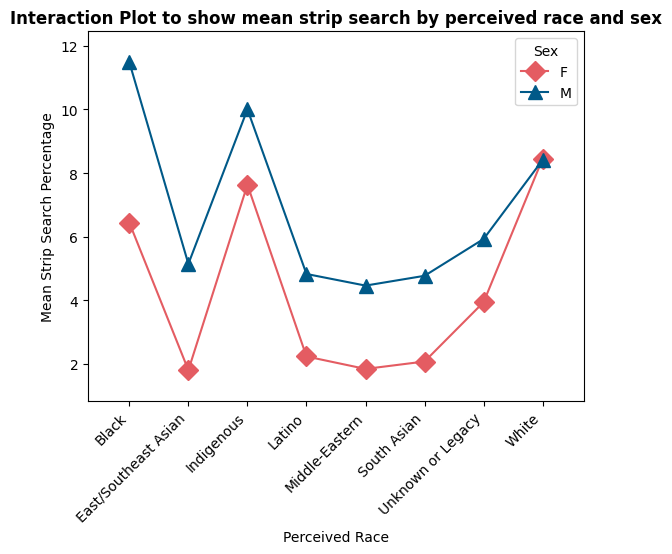

In [50]:
# set the variable type
Sex = df_fin['Sex'].astype("category")
StrSearpe = df_fin['StripSearchPercentage'].values

# interaction plot
rq_2_interaction = interaction_plot(df_fin['Perceived_Race'], Sex, StrSearpe, 
                                    colors=['#e45c62','#005988'], markers=['D','^'], ms=10)


# set the label 
plt.title('Interaction Plot to show mean strip search by perceived race and sex', fontweight='bold')
plt.ylabel('Mean Strip Search Percentage')
plt.xlabel('Perceived Race')
plt.xticks(rotation=45, ha='right')
plt.show()

### Post-hoc test

In [51]:
# tukey comparison for Perceived_Race
mcr = mc.MultiComparison(df_fin['StripSearchPercentage'], df_fin['Perceived_Race'])
mcrresult = mcr.tukeyhsd(0.05)
print(mcrresult.summary())

# no need to run Tukey HSD for sex, because sex only has two levels and its signicifancy is proved by ANOVA result already.

              Multiple Comparison of Means - Tukey HSD, FWER=0.05               
       group1               group2        meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------------
               Black East/Southeast Asian  -6.0568    0.0 -7.6231 -4.4906   True
               Black           Indigenous  -1.4717 0.8675 -4.7084  1.7651  False
               Black               Latino  -6.1311    0.0 -8.5565 -3.7056   True
               Black       Middle-Eastern   -6.422    0.0 -8.2867 -4.5573   True
               Black          South Asian   -6.209    0.0  -7.942  -4.476   True
               Black    Unknown or Legacy  -5.0013    0.0 -6.5695 -3.4331   True
               Black                White  -2.1154    0.0 -3.0909 -1.1399   True
East/Southeast Asian           Indigenous   4.5852 0.0014  1.1496  8.0207   True
East/Southeast Asian               Latino  -0.0742    1.0 -2.7593  2.6108  False
East/Southeast Asian       M

In [52]:
# tukey comparison for the combination of race and sex
interaction_groups =  df_fin.Perceived_Race + " & " +  df_fin.Sex

comp = mc.MultiComparison(df_fin["StripSearchPercentage"], interaction_groups)
post_hoc_res = comp.tukeyhsd()
print(post_hoc_res.summary())
# true: reject the null hypothesis, there is significant difference in mean strip searches between
# black female and black male.
# false: fail to reject, there is no significant difference in mean strip searches between
# effect of black female and East/Southeast Asian male.

/usr/local/lib/python3.9/dist-packages/scipy/integrate/_quadpack_py.py:1225: IntegrationWarning:

The integral is probably divergent, or slowly convergent.



                   Multiple Comparison of Means - Tukey HSD, FWER=0.05                   
         group1                   group2          meandiff p-adj   lower    upper  reject
-----------------------------------------------------------------------------------------
               Black & F                Black & M   5.0445    0.0   2.8744  7.2145   True
               Black & F East/Southeast Asian & F  -4.6361  0.007  -8.6298 -0.6424   True
               Black & F East/Southeast Asian & M  -1.2958 0.9477  -3.9096  1.3181  False
               Black & F           Indigenous & F    1.191    1.0  -4.7953  7.1773  False
               Black & F           Indigenous & M   3.5615 0.5056  -1.4094  8.5325  False
               Black & F               Latino & F  -4.2056 0.7431 -10.9581  2.5468  False
               Black & F               Latino & M  -1.6128 0.9687  -5.0657  1.8401  False
               Black & F       Middle-Eastern & F  -4.5972 0.2753 -10.2452  1.0509  False
          

## Research Question #2

###Data Cleaning

In [53]:
# extract the columns
data_extracted = arr.loc[:,["PersonID","StripSearch", "Age_group__at_arrest_"]]

# Group the data by PersonID and Age
# Calculate the total number of total arrest for each person
data_grouped = data_extracted.groupby(["PersonID","Age_group__at_arrest_"], as_index=False).count()
data_grouped = data_grouped.rename(columns={'StripSearch': 'Total Arrest',"Age_group__at_arrest_": 'Age'})

data_grouped.head(20)

,PersonID,Age,Total Arrest
0,300000,Aged 35 to 44 years,1
1,300001,Aged 17 years and younger,1
2,300002,Aged 35 to 44 years,1
3,300003,Aged 25 to 34 years,6
4,300003,Aged 35 to 44 years,2
5,300004,Aged 25 to 34 years,1
6,300005,Aged 45 to 54 years,1
7,300006,Aged 55 to 64 years,2
8,300007,Aged 25 to 34 years,8
9,300008,Aged 25 to 34 years,1


In [54]:
# Duplicate the strip search column to calculate the average later.
data_extracted['StripSearchPercentage'] = data_extracted.loc[:, 'StripSearch']
data_extracted = data_extracted.rename(columns={"Age_group__at_arrest_": 'Age'})

# Group the rows by personID.
data_percent = data_extracted.groupby(['PersonID',"Age"], as_index=False).agg({'StripSearch':'sum', 
                                                                               'StripSearchPercentage':'mean'})
# transform the percentage column into % values
data_percent['StripSearchPercentage'] = data_percent['StripSearchPercentage'].multiply(100)

# glimpse the dataset
data_percent.head(20)

,PersonID,Age,StripSearch,StripSearchPercentage
0,300000,Aged 35 to 44 years,0,0.0000
1,300001,Aged 17 years and younger,0,0.0000
2,300002,Aged 35 to 44 years,0,0.0000
3,300003,Aged 25 to 34 years,1,16.6667
4,300003,Aged 35 to 44 years,0,0.0000
5,300004,Aged 25 to 34 years,0,0.0000
6,300005,Aged 45 to 54 years,0,0.0000
7,300006,Aged 55 to 64 years,0,0.0000
8,300007,Aged 25 to 34 years,1,12.5000
9,300008,Aged 25 to 34 years,0,0.0000


In [55]:
# Since some observations have more than one age group, to avoid misleading info, these duplicated obs are deleted.
# Get duplicate rows with the same person ID
data_dup = data_percent[data_percent.duplicated('PersonID')]

# get the list of Person ID that have more than one observation.
dup = data_dup['PersonID'].unique()

# remove the duplicate rows
data_dup_reomoved = data_percent[~(data_percent['PersonID'].isin(dup))]

# replace age group names
data_dup_reomoved = data_dup_reomoved.replace(['Aged 17 years and under'],'Aged 17 years and younger')
data_dup_reomoved = data_dup_reomoved.replace(['Aged 65 and older'], 'Aged 65 years and older')
data_dup_reomoved.head(20)

,PersonID,Age,StripSearch,StripSearchPercentage
0,300000,Aged 35 to 44 years,0,0.0000
1,300001,Aged 17 years and younger,0,0.0000
2,300002,Aged 35 to 44 years,0,0.0000
5,300004,Aged 25 to 34 years,0,0.0000
6,300005,Aged 45 to 54 years,0,0.0000
7,300006,Aged 55 to 64 years,0,0.0000
8,300007,Aged 25 to 34 years,1,12.5000
9,300008,Aged 25 to 34 years,0,0.0000
10,300009,Aged 35 to 44 years,0,0.0000
11,300010,Aged 45 to 54 years,0,0.0000


In [56]:
# merge the total arrest column
data_final = pd.merge(data_dup_reomoved, data_grouped, how="left", on=["PersonID", "Age"])

# Rearrage the order of columns
data_final = data_final[['PersonID',
                 'Age',
                 'StripSearch',
                 'Total Arrest',
                 'StripSearchPercentage']]

# Glimpse the dataset
data_final.head(20)

,PersonID,Age,StripSearch,Total Arrest,StripSearchPercentage
0,300000,Aged 35 to 44 years,0,1.0000,0.0000
1,300001,Aged 17 years and younger,0,1.0000,0.0000
2,300002,Aged 35 to 44 years,0,1.0000,0.0000
3,300004,Aged 25 to 34 years,0,1.0000,0.0000
4,300005,Aged 45 to 54 years,0,1.0000,0.0000
5,300006,Aged 55 to 64 years,0,2.0000,0.0000
6,300007,Aged 25 to 34 years,1,8.0000,12.5000
7,300008,Aged 25 to 34 years,0,1.0000,0.0000
8,300009,Aged 35 to 44 years,0,1.0000,0.0000
9,300010,Aged 45 to 54 years,0,1.0000,0.0000


### EDA

In [57]:
# Group the rows with same age
gp_age = data_final.groupby(['Age'], as_index=False).agg({'StripSearch':'sum','Total Arrest':'sum'})

# Calculate the percentage of strip search in each group of ageStripSearch
gp_age["StripSearchPercentage"] = gp_age['StripSearch']/gp_age['Total Arrest']*100  

gp_age.head(20)

,Age,StripSearch,Total Arrest,StripSearchPercentage
0,Aged 17 years and younger,167,1212.0000,13.7789
1,Aged 18 to 24 years,1161,9261.0000,12.5364
2,Aged 25 to 34 years,2490,19641.0000,12.6776
3,Aged 35 to 44 years,1934,15134.0000,12.7792
4,Aged 45 to 54 years,850,8587.0000,9.8987
5,Aged 55 to 64 years,348,4395.0000,7.9181
6,Aged 65 years and older,28,562.0000,4.9822


In [58]:
# Seperate the rows into two different age group
group_1 = data_final.replace(['Aged 17 years and younger','Aged 18 to 24 years','Aged 25 to 34 years'],'Aged under 35')
group_2 = data_final.replace(['Aged 35 to 44 years','Aged 45 to 54 years','Aged 55 to 64 years','Aged 65 years and older'],'Aged 35 and above')

age_under_35 = group_1[(group_1['Age'] == 'Aged under 35')]
age_35_and_above = group_2[(group_2['Age'] == 'Aged 35 and above')]

####Descriptive Statistics

In [59]:
gp_age.describe()

,StripSearch,Total Arrest,StripSearchPercentage
count,7.0000,7.0000,7.0000
mean,996.8571,8398.8571,10.6530
std,931.3597,7090.1896,3.2183
min,28.0000,562.0000,4.9822
25%,257.5000,2803.5000,8.9084
50%,850.0000,8587.0000,12.5364
75%,1547.5000,12197.5000,12.7284
max,2490.0000,19641.0000,13.7789


In [60]:
data_final.groupby(['Age'])['StripSearchPercentage'].describe()

,count,mean,std,min,25%,50%,75%,max
Age,,,,,,,,
Aged 17 years and younger,1789.0000,5.7843,21.9197,0.0000,0.0000,0.0000,0.0000,100.0000
Aged 18 to 24 years,6204.0000,10.1300,27.7138,0.0000,0.0000,0.0000,0.0000,100.0000
Aged 25 to 34 years,11065.0000,8.9254,25.1409,0.0000,0.0000,0.0000,0.0000,100.0000
Aged 35 to 44 years,8152.0000,8.3753,23.7369,0.0000,0.0000,0.0000,0.0000,100.0000
Aged 45 to 54 years,5107.0000,6.9419,22.3480,0.0000,0.0000,0.0000,0.0000,100.0000
Aged 55 to 64 years,2934.0000,5.5122,20.4991,0.0000,0.0000,0.0000,0.0000,100.0000
Aged 65 years and older,987.0000,2.5498,15.3824,0.0000,0.0000,0.0000,0.0000,100.0000


In [61]:
# Boxplot for youth category at arrest
# Box for youth
fig = go.Figure()
fig.add_trace(go.Box(
    y= you["StripSearchPercentage"], 
    name = 'Youth',
    marker_color = '#bc5090',
    boxmean=True))

# Box for not a youth
fig.add_trace(go.Box(
    y= ntyou["StripSearchPercentage"], 
    name = 'Not a youth',
    marker_color = '#58508d',
    boxmean=True))

fig.update_layout(title={'text': '<b>Comparison of Percentage of Strip Searches in youth category at arrest</b>',
                         'y': 0.89},
                  yaxis_title = "Percentage of Strip Searches",
                  xaxis_title = "Youth category",
                  width=800, height=500)

fig.show()

In [62]:
# Bar plot for count total arrest for different age groups
barplot = px.bar(gp_age, x='Age', y = 'Total Arrest',
             title = 'Total arrest for different age groups',
             color_discrete_sequence= ['#3d708f'],
             width=700, height=600)

# Show plot
barplot.show()

In [63]:
# Bar plot for count total arrest for different age groups
barplot = px.bar(gp_age, x='Age', y = 'StripSearchPercentage',
             title = 'Strip Search Percentage for different age groups',
             color_discrete_sequence= ['#8cbcac'],
             width=800, height=600)

barplot.update_layout(title={'text': '<b>Strip Search Percentage for different age groups</b>'},
                      yaxis_title = "Percentage of Strip Searches")
barplot.update_traces(width=0.6)

# Show plot
barplot.show()

In [64]:
# create box plot for age groups
boxplot = go.Figure()
boxplot.add_trace(go.Box(
    x = data_final["Age"], y= data_final["StripSearchPercentage"],
    boxmean=True))

boxplot.update_layout(title={'text': '<b>Comparison of Percentage of Strip Searches for different age groups</b>'},
                  yaxis_title = "Percentage of Strip Searches",
                  xaxis_title = "Age",
                  width=900, height=500)

####Assumption Check:

#####Normality Check

In [65]:
print(stats.shapiro(age_under_35['StripSearchPercentage']))
print(stats.shapiro(age_35_and_above['StripSearchPercentage']))

ShapiroResult(statistic=0.3869403600692749, pvalue=0.0)
ShapiroResult(statistic=0.3521570563316345, pvalue=0.0)


/usr/local/lib/python3.9/dist-packages/scipy/stats/_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



####Welch's t-test

In [66]:
# Welch's t-test for Age
stats.ttest_ind(age_under_35['StripSearchPercentage'], age_35_and_above['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=7.4919359859007235, pvalue=6.940980032529335e-14)

In [67]:
# Calculate mean and standard deviation of Age 
# Age under 35 shows higher mean strip search percentage
print('Mean Strip Search Percentage for age under 35 and 35 and above are:', age_under_35['StripSearchPercentage'].mean(), age_35_and_above['StripSearchPercentage'].mean())
print('Standard deviation for age under 35 and 35 and above are:',age_under_35['StripSearchPercentage'].std(), age_35_and_above['StripSearchPercentage'].std())

Mean Strip Search Percentage for age under 35 and 35 and above are: 9.022677619677653 7.12559541359529
Standard deviation for age under 35 and 35 and above are: 25.757110500735248 22.43890203821706


In [68]:
# compute Confidence interval
cm_2 = sms.CompareMeans(sms.DescrStatsW(age_under_35['StripSearchPercentage']), sms.DescrStatsW(age_35_and_above['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',cm.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (7.815482974282132, 9.820009378547576)


### One-way ANOVA

In [69]:
# Perform One-way ANOVA using spicy.stats
sample_1 = data_final[data_final['Age'] == 'Aged 17 years and younger']['StripSearchPercentage']
sample_2 = data_final[data_final['Age'] == 'Aged 18 to 24 years']['StripSearchPercentage']
sample_3 = data_final[data_final['Age'] == 'Aged 25 to 34 years']['StripSearchPercentage']
sample_4 = data_final[data_final['Age'] == 'Aged 35 to 44 years']['StripSearchPercentage']
sample_5 = data_final[data_final['Age'] == 'Aged 45 to 54 years']['StripSearchPercentage']
sample_6 = data_final[data_final['Age'] == 'Aged 55 to 64 years']['StripSearchPercentage']
sample_7 = data_final[data_final['Age'] == 'Aged 65 years and older']['StripSearchPercentage']

statistic, pvalue = stats.f_oneway(sample_1, sample_2, sample_3,sample_4,sample_5,sample_6,sample_7)

print(f'One-way ANOVA: s = {statistic}, p = {pvalue}')

One-way ANOVA: s = 28.50590773248095, p = 3.286484748171146e-34


In [70]:
# Perform One-way ANOVA using statsmodels
model_2 = ols('StripSearchPercentage ~ C(Age)', data=data_final).fit()
aov_table = sm.stats.anova_lm(model_2, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(Age),100196.6372,6.0000,28.5059,0.0000
Residual,21224982.5374,36231.0000,NaN,NaN


#### Assumption check

In [71]:
# Normality check
stats.shapiro(model_2.resid)

/usr/local/lib/python3.9/dist-packages/scipy/stats/_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



ShapiroResult(statistic=0.4254325032234192, pvalue=0.0)

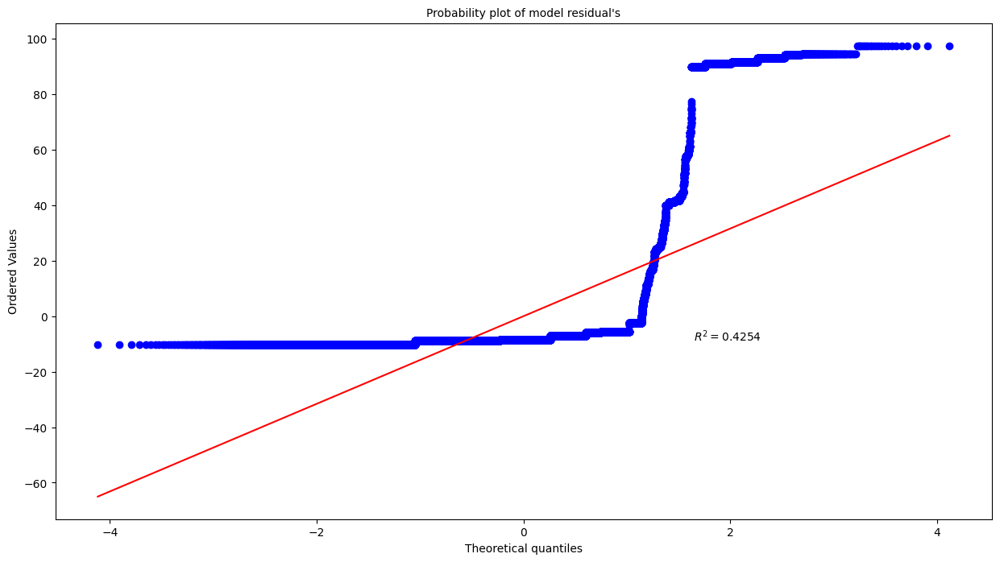

In [72]:
# Visual check of normality
fig = plt.figure(figsize= (15, 8))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(model_2.resid, plot= plt, rvalue= True)
ax.set_title("Probability plot of model residual's", fontsize= 10)
ax.set

plt.show()

In [73]:
# Homogeneity of variance
df_1 = data_final[data_final['Age'] == 'Aged 17 years and younger']
df_2 = data_final[data_final['Age'] == 'Aged 18 to 24 years']
df_3 = data_final[data_final['Age'] == 'Aged 25 to 34 years']
df_4 = data_final[data_final['Age'] == 'Aged 35 to 44 years']
df_5 = data_final[data_final['Age'] == 'Aged 45 to 54 years']
df_6 = data_final[data_final['Age'] == 'Aged 55 to 64 years']
df_7 = data_final[data_final['Age'] == 'Aged 65 years and older']

stats.levene(df_1['StripSearchPercentage'],df_2['StripSearchPercentage'],df_3['StripSearchPercentage'],
             df_4['StripSearchPercentage'],df_5['StripSearchPercentage'],df_6['StripSearchPercentage'],
             df_7['StripSearchPercentage'],center = 'mean')

LeveneResult(statistic=110.93749769197845, pvalue=3.18623837719274e-139)

#### Post-hoc test

In [74]:
# Post-hoc testing using hukey hsd
comp = mc.MultiComparison(data_final['StripSearchPercentage'], data_final['Age'])
post_hoc_res = comp.tukeyhsd()
post_hoc_res.summary()

group1,group2,meandiff,p-adj,lower,upper,reject
Aged 17 years and younger,Aged 18 to 24 years,4.3457,0.0,2.4305,6.2608,True
Aged 17 years and younger,Aged 25 to 34 years,3.1411,0.0,1.3225,4.9596,True
Aged 17 years and younger,Aged 35 to 44 years,2.591,0.0008,0.7278,4.4542,True
Aged 17 years and younger,Aged 45 to 54 years,1.1576,0.5884,-0.803,3.1182,False
Aged 17 years and younger,Aged 55 to 64 years,-0.2721,0.9998,-2.4128,1.8686,False
Aged 17 years and younger,Aged 65 years and older,-3.2345,0.0133,-6.0641,-0.4049,True
Aged 18 to 24 years,Aged 25 to 34 years,-1.2046,0.0283,-2.3365,-0.0727,True
Aged 18 to 24 years,Aged 35 to 44 years,-1.7547,0.0003,-2.957,-0.5523,True
Aged 18 to 24 years,Aged 45 to 54 years,-3.1881,0.0,-4.5364,-1.8397,True
Aged 18 to 24 years,Aged 55 to 64 years,-4.6178,0.0,-6.2167,-3.0188,True


# Final Assignment

## Data Cleaning

In [75]:
# Check if any missing value in negative action variables
arr[['Actions_at_arrest___Concealed_i', 'Actions_at_arrest___Combative__', 'Actions_at_arrest___Resisted__d', 'Actions_at_arrest___Mental_inst', 'Actions_at_arrest___Assaulted_o']].isna().sum()
# No missing value

Actions_at_arrest___Concealed_i    0
Actions_at_arrest___Combative__    0
Actions_at_arrest___Resisted__d    0
Actions_at_arrest___Mental_inst    0
Actions_at_arrest___Assaulted_o    0
dtype: int64

In [76]:
# remove the row that has na value in age group, race, and sex
df_bk = arr.dropna(subset=['Age_group__at_arrest_', 'Perceived_Race', 'Sex'])
# Since for U sex, there's only 3 cases, which is representative enough, these three cases are removed
df_bk = df_bk[df_bk.Sex != 'U']

In [77]:
# Remove the case that is not in df_fin
df_bk = df_bk[df_bk['PersonID'].isin(df_fin['PersonID'])]

In [78]:
# Extract ID and Booked
df_bk = df_bk.loc[:,["PersonID", 'Actions_at_arrest___Concealed_i','Actions_at_arrest___Combative__',
                   'Actions_at_arrest___Resisted__d','Actions_at_arrest___Mental_inst',
                   'Actions_at_arrest___Assaulted_o', "Booked"]]

In [79]:
# Rename negative action columns name
df_bk = df_bk.rename(columns={'Actions_at_arrest___Concealed_i':'Concealed_item',
                                                          'Actions_at_arrest___Combative__':'Combative',
                                                          'Actions_at_arrest___Resisted__d':'Resisted_defensive',
                                                          'Actions_at_arrest___Mental_inst':'Mental_instability',
                                                          'Actions_at_arrest___Assaulted_o':'Assaulted_officer'})

In [80]:
# Group row with same ID, sum the booking
df_bkgp = df_bk.groupby(['PersonID'], as_index=False).agg({'Combative':'sum',
                                'Resisted_defensive':'sum',
                                'Mental_instability':'sum',
                                'Assaulted_officer':'sum',
                                'Booked':'sum'})


In [81]:
# display df_bkgp
df_bkgp.head(10)

,PersonID,Combative,Resisted_defensive,Mental_instability,Assaulted_officer,Booked
0,300000,0,0,0,0,0
1,300001,0,0,0,0,1
2,300002,0,0,0,0,0
3,300003,0,0,1,0,6
4,300004,0,0,0,0,1
5,300005,0,0,0,0,0
6,300006,1,0,1,0,1
7,300007,0,0,0,0,5
8,300008,0,0,0,0,1
9,300009,0,0,0,0,0


In [82]:
# Merge booking table and df_fin table based on the person ID they have in common
df2_finbk = pd.merge(df_fin, df_bkgp, how="inner", on="PersonID") # there is no missing value in Booked, therefore the dataframe size is the same as df_fin (34650 obs)

In [83]:
# Drop StripSearch column
df2_finbk = df2_finbk.drop(df2_finbk.columns[4], axis=1)

In [84]:
# Changeing the value of StripSearchPercentage into binary with 0 for 0.0, and 1 for all values greater than 0
df2_finbk['StripSearchPercentage'] = df2_finbk['StripSearchPercentage'].apply(lambda x: 1 if x > 0 else 0 if x == 0.0 else x)

# Rename the StripSearchPercentage as StripSearch
df2_finbk = df2_finbk.rename(columns={'StripSearchPercentage': 'StripSearch'})

In [85]:
# Merge df2_finbk and age group, youth status columns based on the person ID they have in common
df2_fin = pd.merge(df2_finbk, df_dpag, how="inner", on="PersonID") # remove 605 cases, there are 34045 obs in total. Large sample size, which is good for logistic regression to 


# Rename the columns
df2_fin = df2_fin.rename(columns={'Age_group__at_arrest_': 'Age Group',
                                  'Youth_at_arrest__under_18_years' : 'Youth Status'})

# Rearrange the column order
new_order = [0, 2, 1, 12, 11, 6, 7, 8, 9, 3, 4, 5, 10, 13]
df2_fin = df2_fin[df2_fin.columns[new_order]]


In [86]:
# Since Latino and Ingenous groups have small sample size, these two groups are combined into one called "Latino/Indigenous"
df2_fin['Perceived_Race'] = df2_fin['Perceived_Race'].replace({'Latino': 'Latino/Indigenous', 'Indigenous': 'Latino/Indigenous'})

In [87]:
# add column to calcuate the proportion of being booded amoung the total arrest
df2_fin['Proportion_Booked'] = df2_fin['Booked'] / df2_fin['Total Arrest']

In [88]:
# display the first 10 lines of df2_fin
df2_fin.head(10)

,PersonID,Sex,Perceived_Race,Youth Status,Age Group,Combative,Resisted_defensive,Mental_instability,Assaulted_officer,Negative Action,Total Arrest,StripSearch,Booked,StripSearchPercentage,Proportion_Booked
0,300000,M,East/Southeast Asian,Not a youth,Aged 35 to 44 years,0,0,0,0,0,1,0,0,0.0000,0.0000
1,300001,F,White,Youth,Aged 17 years and under,0,0,0,0,0,1,0,1,0.0000,1.0000
2,300002,M,White,Not a youth,Aged 35 to 44 years,0,0,0,0,0,1,0,0,0.0000,0.0000
3,300004,M,Black,Not a youth,Aged 25 to 34 years,0,0,0,0,0,1,0,1,0.0000,1.0000
4,300005,M,South Asian,Not a youth,Aged 45 to 54 years,0,0,0,0,0,1,0,0,0.0000,0.0000
5,300006,M,Middle-Eastern,Not a youth,Aged 55 to 64 years,1,0,1,0,2,2,0,1,0.0000,0.5000
6,300007,M,South Asian,Not a youth,Aged 25 to 34 years,0,0,0,0,0,8,1,5,12.5000,0.6250
7,300008,M,Black,Not a youth,Aged 25 to 34 years,0,0,0,0,0,1,0,1,0.0000,1.0000
8,300009,M,White,Not a youth,Aged 35 to 44 years,0,0,0,0,0,1,0,0,0.0000,0.0000
9,300010,M,South Asian,Not a youth,Aged 45 to 54 years,0,0,0,0,0,1,0,0,0.0000,0.0000


## EDA

### Descriptive Statistics

#### Strip Search (binary)

In [89]:
# separate the dataset based on sex
male = df2_fin[(df2_fin['Sex'] == 'M')]
female = df2_fin[(df2_fin['Sex'] == 'F')]

In [90]:
# Plot the histogram to visulize the distribution of perceived race in different sex
fig = go.Figure()
fig.add_trace(go.Histogram(
    x=male['Perceived_Race'],
    histnorm='density',
    name='Male', 
    marker_color='#415e97',
    opacity=0.75
))

fig.add_trace(go.Histogram(
    x=female['Perceived_Race'],
    histnorm='density',
    name='Female',
    marker_color='#da8f1b',
    opacity=0.75
))


fig.update_layout(
    title_text='<b>Number of Male and Female in the Arrest Records </b>', 
    xaxis_title_text='Perceived Race', 
    yaxis_title_text='Count of individual', 
    xaxis=dict(
        categoryorder='array',
        categoryarray=["White", "Black", 
                        "Unknown or Legacy","East/Southeast Asian",
                      "South Asian","Middle-Eastern",
                       "Latino/Indigenous"]
    ),
    bargap=0.2, 
    bargroupgap=0.1,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99),
        width=800, height=600 
)




In [91]:
# Group the rows with same race and sex
gp2_race = df2_fin.groupby(['Perceived_Race','Sex'], as_index=False).agg({'StripSearch':'sum',
                                                                          'Total Arrest':'sum'})

In [92]:
# Bar plot for count total arrest for different races across the sex categories.
fig = px.bar(gp2_race, x='Perceived_Race', y = 'Total Arrest',
             color = "Sex", barmode='group',
             color_discrete_sequence= ['#003F5C','#86BCB6'],
             category_orders = {"Perceived_Race": ["White", "Black", 
                                                   "East/Southeast Asian",
                                                   "Unknown or Legacy",
                                                   "South Asian","Middle-Eastern",
                                                   "Latino/Indigenous"],
                                "Sex": ["M","F"]},
             width=700, height=600)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b> Total Arrest Number across various Perceived Race</b>',
                  yaxis_title = "Number of arrest",
                  xaxis_title = "Perceived Race",
                  legend=dict(
                      yanchor="top",
                      y=0.99,
                      xanchor="right",
                      x=0.99)
                  
)

# Show plot
fig.show()

In [93]:
df2_fin.groupby('StripSearch').size()

StripSearch
0    30260
1     3783
dtype: int64

In [94]:
# Calculate the percentage of strip search in each group of race and sex
gp2_race["StripSearchPercentage"] = gp2_race['StripSearch']/gp2_race['Total Arrest']

# Glimpse the dataset
gp2_race.head(20)

,Perceived_Race,Sex,StripSearch,Total Arrest,StripSearchPercentage
0,Black,F,155,2489,0.0623
1,Black,M,1220,12146,0.1004
2,East/Southeast Asian,F,11,614,0.0179
3,East/Southeast Asian,M,142,2670,0.0532
4,Latino/Indigenous,F,26,559,0.0465
5,Latino/Indigenous,M,103,1619,0.0636
6,Middle-Eastern,F,5,272,0.0184
7,Middle-Eastern,M,88,1888,0.0466
8,South Asian,F,8,379,0.0211
9,South Asian,M,102,2108,0.0484


In [95]:
# Bar plot for Perceived Race
fig = px.bar(gp2_race, x='Perceived_Race', y = 'StripSearchPercentage',
             color = "Sex", barmode='group',
             color_discrete_sequence= ['#003F5C','#86BCB6'],
             category_orders = {"Perceived_Race": ["White", "Black", 
                                                   "East/Southeast Asian",
                                                   "Unknown or Legacy",
                                                   "South Asian","Middle-Eastern",
                                                   "Latino/Indigenous"],
                                "Sex": ["M","F"]},
             width=700, height=600)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b>Percentage of Mean Strip Searches in various Perceived Race</b>',
                  yaxis_title = "Percentage of Mean Strip Searches",
                  xaxis_title = "Perceived Race"
                  
)

# Show plot
fig.show()

In [96]:
# Create a box plot for negative action based on being strip searched or not
# separte strip search to 2 dataset
# filter out rows that being searched
searched = df2_fin.loc[df2_fin['StripSearch'] == 1]

# filter out rows that has not being searched 
notsearched = df2_fin.loc[df2_fin['StripSearch'] == 0]

In [97]:
# create box plot for negative action
fig = go.Figure()
# box for no action
fig.add_trace(go.Box(
    y= notsearched["Negative Action"], 
    name = 'Not Strip Searched',
    marker_color = '#2a817a',
    boxmean=True))
# box for has action
fig.add_trace(go.Box(
    y= searched["Negative Action"], 
    name = 'Strip Searched',
    marker_color = '#ddb232',
    boxmean=True))



# Set the title and x,y axes label
fig.update_layout(title= {'text':'<b>Box Plot for Strip Searches vs. Negative action</b>',
                          'y': 0.89},
                  yaxis_title = "Number of Negative Action",
                  xaxis_title = "Strip Search Status",
                  width=600, height=600)

In [98]:
# make a copy of df2_fin
df_neg = df2_fin.copy()

# Break negative action into categories
df_neg['Label'] = pd.cut(x=df_neg['Negative Action'],
                     bins=[-1, 4, 8, 14, 22],
                     labels=['0 to 4', ' 5 to 8', '9 to 14', '15 to 21'])

In [99]:
# plot histogram to see how many people being searched vs. not being searched across different age groups 
fig = px.histogram(df2_fin, x="Age Group", color="StripSearch",
                   color_discrete_sequence=["#58508d", "#bc5090"],
                   category_orders={"Age Group": ['Aged 17 years and under', 
                                                  'Aged 18 to 24 years',
                                                  'Aged 25 to 34 years',
                                                  'Aged 35 to 44 years',
                                                  'Aged 45 to 54 years',
                                                  'Aged 55 to 64 years',
                                                  'Aged 65 years and older']},
                   barmode="group",
                   width=700, height=600)

# Update the layout and axis labels
fig.update_layout(title='<b>Age Group vs. Strip Search Status </b>',
                  xaxis_title="Age Group", yaxis_title="Count")


            

fig.show()
# it shows the count for number of people being searched and not searched across different age groups

In [100]:
# plot histogram to see how many people being searched vs. not being searched across different perceived race 
fig = px.histogram(df2_fin, x="Perceived_Race", color="StripSearch",
                   color_discrete_sequence=["#298b8f", "#d9a412"],
                   category_orders={"Perceived_Race": ["White", "Black", 
                                                   "East/Southeast Asian",
                                                   "Unknown or Legacy",
                                                   "South Asian","Middle-Eastern",
                                                   "Latino/Indigenous"]},
                   barmode="group",
                   width=700, height=600)

# Update the layout and axis labels
fig.update_layout(title='<b>Perceived Race vs. Strip Search Status </b>',
                  xaxis_title="Perceived Race", yaxis_title="Count")


            

fig.show()

In [101]:
# plot histogram to see how many people being searched vs. not being searched across different perceived race 
fig = px.histogram(df2_fin, x="Sex", color="StripSearch",
                   color_discrete_sequence=["#c24a7c", "#d9a412"],
                   barmode="group",
                   width=500, height=400)

# Update the layout and axis labels
fig.update_layout(title='<b>Perceived Race vs. Strip Search Status </b>',
                  xaxis_title="Sex", yaxis_title="Count")


            

fig.show()

In [102]:
# plot histogram to see how many people being searched vs. not being searched across different negative action 
fig = px.histogram(df2_fin, x="Negative Action", color="StripSearch",
                   color_discrete_sequence=["#c24a7c", "#d9a412"],
                   barmode="group",
                   width=700, height=600)

# Update the layout and axis labels
fig.update_layout(title='<b>Perceived Race vs. Strip Search Status </b>',
                  xaxis_title="Number of Negative Action at Arrest", yaxis_title="Count")


            

fig.show()

In [103]:
# Cross-tabluation for strip searches and age group
ct_age = df2_fin.groupby(["Age Group", "StripSearch"])["PersonID"].count().unstack()
ct_age

StripSearch,0,1
Age Group,,
Aged 17 years and under,1723,144
Aged 18 to 24 years,5076,725
Aged 25 to 34 years,9003,1271
Aged 35 to 44 years,6579,933
Aged 45 to 54 years,4315,467
Aged 55 to 64 years,2578,213
Aged 65 years and older,986,30


In [104]:
# check the proportion of seach and not search within each level of age group,  search + did not search add up to 1
search_percents = ct_age.T.div(ct_age.T.sum()).T
search_percents
# 0.92 means for age 17 years and under, 92% are not searched, 7.7% are searched

StripSearch,0,1
Age Group,,
Aged 17 years and under,0.9229,0.0771
Aged 18 to 24 years,0.8750,0.1250
Aged 25 to 34 years,0.8763,0.1237
Aged 35 to 44 years,0.8758,0.1242
Aged 45 to 54 years,0.9023,0.0977
Aged 55 to 64 years,0.9237,0.0763
Aged 65 years and older,0.9705,0.0295


In [105]:
# check distribution of searched and not searched with each groups of age categories
fig = px.bar(search_percents* 100, x=search_percents.index, y=search_percents.columns,
             color_discrete_sequence=["#E8B4B8","#A49393"],
             width = 700, height = 600)

fig.update_layout(title="<b>Strip Search vs. Age Group</b>",
                  xaxis_title="Age Group", yaxis_title="Proportion of Strip Search Status")

fig.update_layout(barmode="stack", uniformtext_minsize=8, uniformtext_mode="hide")
fig.update_traces(texttemplate='%{value:.2f}%', textposition='inside',textfont_color="white")

fig.show()



In [106]:
# Since Latino and Ingenous groups have small sample size, these two groups are combined into one called "Latino/Indigenous"
df2_fin['Perceived_Race'] = df2_fin['Perceived_Race'].replace({'Latino': 'Latino/Indigenous', 'Indigenous': 'Latino/Indigenous'})


In [107]:
# Cross-tabluation for strip searches and perceived race
ct_race = df2_fin.groupby(["Perceived_Race", "StripSearch"])["PersonID"].count().unstack()
ct_race

StripSearch,0,1
Perceived_Race,,
Black,7936,1375
East/Southeast Asian,2672,153
Latino/Indigenous,1401,129
Middle-Eastern,1734,93
South Asian,2078,110
Unknown or Legacy,2651,170
White,11788,1753


In [108]:
# Divide by the total number 
race_percents = ct_race.div(ct_race.sum()).mul(100).round(2).T
race_percents

Perceived_Race,Black,East/Southeast Asian,Latino/Indigenous,Middle-Eastern,South Asian,Unknown or Legacy,White
StripSearch,,,,,,,
0,26.2300,8.8300,4.6300,5.7300,6.8700,8.7600,38.9600
1,36.3500,4.0400,3.4100,2.4600,2.9100,4.4900,46.3400


In [109]:
# Check the proportion of searched and not searched within each level of race
search_percents_race = ct_race.T.div(ct_race.T.sum()).T
search_percents_race

StripSearch,0,1
Perceived_Race,,
Black,0.8523,0.1477
East/Southeast Asian,0.9458,0.0542
Latino/Indigenous,0.9157,0.0843
Middle-Eastern,0.9491,0.0509
South Asian,0.9497,0.0503
Unknown or Legacy,0.9397,0.0603
White,0.8705,0.1295


In [110]:
# check distribution of searched and not searched with each groups of age categories
fig = px.bar(search_percents_race* 100, x=search_percents_race.index, y=search_percents_race.columns,
             color_discrete_sequence=["#E8B4B8","#A49393"],
             width = 700, height = 600)

fig.update_layout(title="<b>Strip Search vs. Perceived Race</b>",
                  xaxis_title="Perceived Race", yaxis_title="Proportion of Strip Search Status")

fig.update_layout(barmode="stack", uniformtext_minsize=8, uniformtext_mode="hide")
fig.update_traces(texttemplate='%{value:.2f}%', textposition='inside',textfont_color="white")

fig.show()


In [111]:
# Cross-tabluation for strip searches and sex
ct_sex = df2_fin.groupby(["Sex", "StripSearch"])["PersonID"].count().unstack()
ct_sex

StripSearch,0,1
Sex,,
F,6488,626
M,23772,3157


In [112]:
# Divide by the total number 
sex_percents = ct_sex.div(ct_sex.sum()).mul(100).round(2).T
sex_percents

Sex,F,M
StripSearch,,
0,21.4400,78.5600
1,16.5500,83.4500


In [113]:
# Check the proportion of searched and not searched within each level of sex
search_percents_sex = ct_sex.T.div(ct_sex.T.sum()).T
search_percents_sex

StripSearch,0,1
Sex,,
F,0.9120,0.0880
M,0.8828,0.1172


In [114]:
# check distribution of searched and not searched with each groups of age categories
fig = px.bar(search_percents_sex* 100, x=search_percents_sex.index, y=search_percents_sex.columns,
             color_discrete_sequence=["#E8B4B8","#A49393"],
             width = 500, height = 400)

fig.update_layout(title="<b>Strip Search vs. Sex</b>",
                  xaxis_title="Sex", yaxis_title="Proportion of Strip Search Status")

fig.update_layout(barmode="stack", uniformtext_minsize=8, uniformtext_mode="hide")
fig.update_traces(texttemplate='%{value:.2f}%', textposition='inside',textfont_color="white")

fig.show()
# not huge difference between male and female for being searched
# may not be consider to include in the model

In [115]:
# Separate dataset based on the strip search level
sr = df2_fin[(df2_fin['StripSearch'] == 1)]
nonsr = df2_fin[(df2_fin['StripSearch'] == 0)]

In [116]:
# proportion of race and age for searched case
conttab_sr_per = pd.crosstab(index=[sr['Perceived_Race']], 
                                columns=[sr['Age Group']], 
                         normalize='index')


# display the table
conttab_sr_per

Age Group,Aged 17 years and under,Aged 18 to 24 years,Aged 25 to 34 years,Aged 35 to 44 years,Aged 45 to 54 years,Aged 55 to 64 years,Aged 65 years and older
Perceived_Race,,,,,,,
Black,0.0625,0.2909,0.3535,0.1775,0.0785,0.0305,0.0065
East/Southeast Asian,0.0131,0.2484,0.3137,0.2288,0.1503,0.0327,0.0131
Latino/Indigenous,0.0233,0.1705,0.3178,0.2636,0.1473,0.0543,0.0233
Middle-Eastern,0.0538,0.3656,0.2258,0.1828,0.1290,0.0430,0.0000
South Asian,0.0364,0.2545,0.3273,0.2273,0.1000,0.0364,0.0182
Unknown or Legacy,0.0588,0.2176,0.3706,0.2235,0.0824,0.0353,0.0118
White,0.0194,0.0947,0.3286,0.3080,0.1597,0.0827,0.0068


In [117]:
conttab_sr_per *100

Age Group,Aged 17 years and under,Aged 18 to 24 years,Aged 25 to 34 years,Aged 35 to 44 years,Aged 45 to 54 years,Aged 55 to 64 years,Aged 65 years and older
Perceived_Race,,,,,,,
Black,6.2545,29.0909,35.3455,17.7455,7.8545,3.0545,0.6545
East/Southeast Asian,1.3072,24.8366,31.3725,22.8758,15.0327,3.2680,1.3072
Latino/Indigenous,2.3256,17.0543,31.7829,26.3566,14.7287,5.4264,2.3256
Middle-Eastern,5.3763,36.5591,22.5806,18.2796,12.9032,4.3011,0.0000
South Asian,3.6364,25.4545,32.7273,22.7273,10.0000,3.6364,1.8182
Unknown or Legacy,5.8824,21.7647,37.0588,22.3529,8.2353,3.5294,1.1765
White,1.9395,9.4695,32.8580,30.8043,15.9726,8.2715,0.6845


In [118]:
fig = px.bar(conttab_sr_per, x=conttab_sr_per.index, y=conttab_sr_per.columns, barmode='group',
             color_discrete_sequence=["#0B84A5","#F6C85F", "#6F4E7C", "#CA472F","#9DD866","#8DDDD0","#FFA056"],)
fig.update_layout(title='Distribution of Strip Searched vs. Perceived Race (broke down by age group)', 
                  xaxis_title='Perceived Race', yaxis_title='Proportion of Strip Searched', legend_title='Age Group')
fig.show()
# no huge difference -> not considering the interaction effect.

##### May delete

In [119]:
# Divide by the total number 
age_percents = ct_age.div(ct_age.sum()).mul(100).round(2).T
age_percents

# 5.69 means for non searched people, there is 5.69% people is aged 17 years and under.

Age Group,Aged 17 years and under,Aged 18 to 24 years,Aged 25 to 34 years,Aged 35 to 44 years,Aged 45 to 54 years,Aged 55 to 64 years,Aged 65 years and older
StripSearch,,,,,,,
0,5.6900,16.7700,29.7500,21.7400,14.2600,8.5200,3.2600
1,3.8100,19.1600,33.6000,24.6600,12.3400,5.6300,0.7900


In [120]:
# stack bar plot to see the distribution of each age group
fig = px.bar(age_percents, x=age_percents.index, y=age_percents.columns,
             color_discrete_sequence=["#264e70", "#916789", "#679186", "#bbd4ce",
                                      "#ffb49d", "#fdebd3", "#B1A894"])

fig.update_layout(title="Strip Search vs. Age Group",
                  xaxis_title="Strip Search Status", yaxis_title="Proportion of Age Group",
                  xaxis_tickvals=[0, 1],
                  xaxis_ticktext=['Not Strip Searched', 'Strip Searched'],
                  legend_title="Age Group")

fig.update_layout(barmode="stack", uniformtext_minsize=8, uniformtext_mode="hide")
fig.update_traces(texttemplate='%{value}%', textposition='inside')
fig.show()


In [121]:
# create a contingency table for gender, age_group, race -> searched cases
conttab_fin2 = pd.crosstab(index=[df2_fin['Perceived_Race']], 
                                columns=[df2_fin['Age Group'],df2_fin['StripSearch']], 
                         margins=True, margins_name='Total')

conttab_fin2

Age Group            Aged 17 years and under      Aged 18 to 24 years       \
StripSearch                                0    1                   0    1   
Perceived_Race                                                               
Black                                    638   86                1756  400   
East/Southeast Asian                     120    2                 510   38   
Latino/Indigenous                         50    3                 224   22   
Middle-Eastern                           110    5                 371   34   
South Asian                               73    4                 409   28   
Unknown or Legacy                        119   10                 457   37   
White                                    613   34                1349  166   
Total                                   1723  144                5076  725   

Age Group            Aged 25 to 34 years       Aged 35 to 44 years       \
StripSearch                            0     1                   0    1   
Perceived_Race                                                            
Black                               2687   486                1603  244   
East/Southeast Asian                 727    48                 578   35   
Latino/Indigenous                    504    41                 333   34   
Middle-Eastern                       519    21                 351   17   
South Asian                          641    36                 431   25   
Unknown or Legacy                    815    63                 576   38   
White                               3110   576                2707  540   
Total                               9003  1271                6579  933   

Age Group            Aged 45 to 54 years      Aged 55 to 64 years       \
StripSearch                            0    1                   0    1   
Perceived_Race                                                           
Black                                779  108                 358   42   
East/Southeast Asian                 358   23                 253    5   
Latino/Indigenous                    187   19                  80    7   
Middle-Eastern                       234   12                 112    4   
South Asian                          302   11                 152    4   
Unknown or Legacy                    365   14                 234    6   
White                               2090  280                1389  145   
Total                               4315  467                2578  213   

Age Group            Aged 65 years and older      Total  
StripSearch                                0   1         
Perceived_Race                                           
Black                                    115   9   9311  
East/Southeast Asian                     126   2   2825  
Latino/Indigenous                         23   3   1530  
Middle-Eastern                            37   0   1827  
South Asian                               70   2   2188  
Unknown or Legacy                         85   2   2821  
White                                    530  12  13541  
Total                                    986  30  34043

In [122]:
# create a contingency table for  age_group, race -> searched cases
conttab_sr = pd.crosstab(index=[sr['Perceived_Race']], 
                                columns=[sr['Age Group']])

conttab_sr

Age Group,Aged 17 years and under,Aged 18 to 24 years,Aged 25 to 34 years,Aged 35 to 44 years,Aged 45 to 54 years,Aged 55 to 64 years,Aged 65 years and older
Perceived_Race,,,,,,,
Black,86,400,486,244,108,42,9
East/Southeast Asian,2,38,48,35,23,5,2
Latino/Indigenous,3,22,41,34,19,7,3
Middle-Eastern,5,34,21,17,12,4,0
South Asian,4,28,36,25,11,4,2
Unknown or Legacy,10,37,63,38,14,6,2
White,34,166,576,540,280,145,12


In [123]:
# visuzlied the distribution of age group and race for searched case.

fig = px.bar(conttab_sr, x=conttab_sr.index, y=conttab_sr.columns, barmode='group',
             color_discrete_sequence=["#0B84A5","#F6C85F", "#6F4E7C", "#CA472F","#9DD866","#8DDDD0","#FFA056"],)
fig.update_layout(title='Contingency Table for Age Group, and Race - Strip Searched Cases', 
                  xaxis_title='Perceived Race', yaxis_title='Count of Strip Searched case', legend_title='Age Group')
fig.show()


In [124]:
# create a contingency table for gender, age_group, race -> searched cases
conttab_sr = pd.crosstab(index=[sr['Sex'], sr['Perceived_Race']], 
                                columns=[sr['Age Group']], 
                         margins=True, margins_name='Total')

conttab_sr

Age Group                   Aged 17 years and under  Aged 18 to 24 years  \
Sex   Perceived_Race                                                       
F     Black                                       9                   49   
      East/Southeast Asian                        0                    3   
      Latino/Indigenous                           0                    5   
      Middle-Eastern                              0                    2   
      South Asian                                 0                    2   
      Unknown or Legacy                           0                    7   
      White                                       8                   44   
M     Black                                      77                  351   
      East/Southeast Asian                        2                   35   
      Latino/Indigenous                           3                   17   
      Middle-Eastern                              5                   32   
      South Asian                                 4                   26   
      Unknown or Legacy                          10                   30   
      White                                      26                  122   
Total                                           144                  725   

Age Group                   Aged 25 to 34 years  Aged 35 to 44 years  \
Sex   Perceived_Race                                                   
F     Black                                  54                   20   
      East/Southeast Asian                    2                    3   
      Latino/Indigenous                      10                    6   
      Middle-Eastern                          2                    1   
      South Asian                             4                    1   
      Unknown or Legacy                       8                    4   
      White                                 143                  127   
M     Black                                 432                  224   
      East/Southeast Asian                   46                   32   
      Latino/Indigenous                      31                   28   
      Middle-Eastern                         19                   16   
      South Asian                            32                   24   
      Unknown or Legacy                      55                   34   
      White                                 433                  413   
Total                                      1271                  933   

Age Group                   Aged 45 to 54 years  Aged 55 to 64 years  \
Sex   Perceived_Race                                                   
F     Black                                  21                    2   
      East/Southeast Asian                    2                    1   
      Latino/Indigenous                       3                    1   
      Middle-Eastern                          0                    0   
      South Asian                             0                    0   
      Unknown or Legacy                       3                    1   
      White                                  58                   16   
M     Black                                  87                   40   
      East/Southeast Asian                   21                    4   
      Latino/Indigenous                      16                    6   
      Middle-Eastern                         12                    4   
      South Asian                            11                    4   
      Unknown or Legacy                      11                    5   
      White                                 222                  129   
Total                                       467                  213   

Age Group                   Aged 65 years and older  Total  
Sex   Perceived_Race                                        
F     Black                                       0    155  
      East/Southeast Asian                        0     11  
      Latino/

In [125]:
# create a contingency table for gender, age_group, race in percentage -> searched cases
conttab_sr_perc = pd.crosstab(index=[sr['Sex'], sr['Perceived_Race']], 
                                columns=[sr['Age Group']], 
                         margins=True, margins_name='Total',
                         normalize='index')

# calculate the percentage of each cell
conttab_sr_perc = (conttab_sr_perc * 100).round(2).astype(str) + '%'

# Add total column in percentage
conttab_sr_perc['Total'] = conttab_sr_perc.apply(lambda row: '100%', axis=1)

# display the table
conttab_sr_perc

# check if the cell value in each column (within one age group) is similar acorss the rows
# if not, it may suggest the lack of independence

Age Group                  Aged 17 years and under Aged 18 to 24 years  \
Sex   Perceived_Race                                                     
F     Black                                  5.81%              31.61%   
      East/Southeast Asian                    0.0%              27.27%   
      Latino/Indigenous                       0.0%              19.23%   
      Middle-Eastern                          0.0%               40.0%   
      South Asian                             0.0%               25.0%   
      Unknown or Legacy                       0.0%              30.43%   
      White                                  2.01%              11.06%   
M     Black                                  6.31%              28.77%   
      East/Southeast Asian                   1.41%              24.65%   
      Latino/Indigenous                      2.91%               16.5%   
      Middle-Eastern                         5.68%              36.36%   
      South Asian                            3.92%              25.49%   
      Unknown or Legacy                       6.8%              20.41%   
      White                                  1.92%                9.0%   
Total                                        3.81%              19.16%   

Age Group                  Aged 25 to 34 years Aged 35 to 44 years  \
Sex   Perceived_Race                                                 
F     Black                             34.84%               12.9%   
      East/Southeast Asian              18.18%              27.27%   
      Latino/Indigenous                 38.46%              23.08%   
      Middle-Eastern                     40.0%               20.0%   
      South Asian                        50.0%               12.5%   
      Unknown or Legacy                 34.78%              17.39%   
      White                             35.93%              31.91%   
M     Black                             35.41%              18.36%   
      East/Southeast Asian              32.39%              22.54%   
      Latino/Indigenous                  30.1%              27.18%   
      Middle-Eastern                    21.59%              18.18%   
      South Asian                       31.37%              23.53%   
      Unknown or Legacy                 37.41%              23.13%   
      White                             31.96%              30.48%   
Total                                    33.6%              24.66%   

Age Group                  Aged 45 to 54 years Aged 55 to 64 years  \
Sex   Perceived_Race                                                 
F     Black                             13.55%               1.29%   
      East/Southeast Asian              18.18%               9.09%   
      Latino/Indigenous                 11.54%               3.85%   
      Middle-Eastern                      0.0%                0.0%   
      South Asian                         0.0%                0.0%   
      Unknown or Legacy                 13.04%               4.35%   
      White                             14.57%               4.02%   
M     Black                              7.13%               3.28%   
      East/Southeast Asian              14.79%               2.82%   
      Latino/Indigenous                 15.53%               5.83%   
      Middle-Eastern                    13.64%               4.55%   
      South Asian                       10.78%               3.92%   
      Unknown or Legacy                  7.48%                3.4%   
      White                             16.38%               9.52%   
Total                                   12.34%               5.63%   

Age Group                  Aged 65 years and older Total  
Sex   Perceived_Race                                      
F     Black                                   0.0%  100%  
      East/Southeast Asian                    0.0%  100%  
      Latino/Indigenous                      3.85%  100%  
      Middle-Eastern                          0.0%  100%  
     

In [126]:
# create a contingency table for gender, age_group, race -> not searched cases
conttab_nsr = pd.crosstab(index=[nonsr['Sex'], nonsr['Perceived_Race']], 
                                columns=[nonsr['Age Group']], 
                         margins=True, margins_name='Total')

conttab_nsr

Age Group                   Aged 17 years and under  Aged 18 to 24 years  \
Sex   Perceived_Race                                                       
F     Black                                     170                  398   
      East/Southeast Asian                       30                  102   
      Latino/Indigenous                          18                   66   
      Middle-Eastern                             20                   55   
      South Asian                                20                   74   
      Unknown or Legacy                          24                   98   
      White                                     201                  421   
M     Black                                     468                 1358   
      East/Southeast Asian                       90                  408   
      Latino/Indigenous                          32                  158   
      Middle-Eastern                             90                  316   
      South Asian                                53                  335   
      Unknown or Legacy                          95                  359   
      White                                     412                  928   
Total                                          1723                 5076   

Age Group                   Aged 25 to 34 years  Aged 35 to 44 years  \
Sex   Perceived_Race                                                   
F     Black                                 532                  291   
      East/Southeast Asian                  144                  122   
      Latino/Indigenous                     140                   71   
      Middle-Eastern                         59                   48   
      South Asian                           108                   70   
      Unknown or Legacy                     179                  117   
      White                                 814                  622   
M     Black                                2155                 1312   
      East/Southeast Asian                  583                  456   
      Latino/Indigenous                     364                  262   
      Middle-Eastern                        460                  303   
      South Asian                           533                  361   
      Unknown or Legacy                     636                  459   
      White                                2296                 2085   
Total                                      9003                 6579   

Age Group                   Aged 45 to 54 years  Aged 55 to 64 years  \
Sex   Perceived_Race                                                   
F     Black                                 134                   69   
      East/Southeast Asian                   79                   54   
      Latino/Indigenous                      32                   14   
      Middle-Eastern                         35                   13   
      South Asian                            49                   21   
      Unknown or Legacy                      62                   45   
      White                                 446                  252   
M     Black                                 645                  289   
      East/Southeast Asian                  279                  199   
      Latino/Indigenous                     155                   66   
      Middle-Eastern                        199                   99   
      South Asian                           253                  131   
      Unknown or Legacy                     303                  189   
      White                                1644                 1137   
Total                                      4315                 2578   

Age Group                   Aged 65 years and older  Total  
Sex   Perceived_Race                                        
F     Black                                      13   1607  
      East/Southeast Asian                       23    554  
      Latino/

In [127]:
# create a contingency table for gender, age_group, race in percentage -> not searched cases
conttab_nsr_perc = pd.crosstab(index=[nonsr['Sex'], nonsr['Perceived_Race']], 
                                columns=[nonsr['Age Group']], 
                         margins=True, margins_name='Total',
                         normalize='index')

# calculate the percentage of each cell
conttab_nsr_perc = (conttab_nsr_perc * 100).round(2).astype(str) + '%'

# Add total column in percentage
conttab_nsr_perc['Total'] = conttab_nsr_perc.apply(lambda row: '100%', axis=1)

# display the table
conttab_nsr_perc

Age Group                  Aged 17 years and under Aged 18 to 24 years  \
Sex   Perceived_Race                                                     
F     Black                                 10.58%              24.77%   
      East/Southeast Asian                   5.42%              18.41%   
      Latino/Indigenous                      5.17%              18.97%   
      Middle-Eastern                         8.44%              23.21%   
      South Asian                            5.68%              21.02%   
      Unknown or Legacy                      4.49%              18.35%   
      White                                  7.04%              14.74%   
M     Black                                  7.39%              21.46%   
      East/Southeast Asian                   4.25%              19.26%   
      Latino/Indigenous                      3.04%               15.0%   
      Middle-Eastern                         6.01%              21.11%   
      South Asian                            3.07%              19.41%   
      Unknown or Legacy                      4.49%              16.96%   
      White                                  4.61%              10.39%   
Total                                        5.69%              16.77%   

Age Group                  Aged 25 to 34 years Aged 35 to 44 years  \
Sex   Perceived_Race                                                 
F     Black                             33.11%              18.11%   
      East/Southeast Asian              25.99%              22.02%   
      Latino/Indigenous                 40.23%               20.4%   
      Middle-Eastern                    24.89%              20.25%   
      South Asian                       30.68%              19.89%   
      Unknown or Legacy                 33.52%              21.91%   
      White                              28.5%              21.78%   
M     Black                             34.05%              20.73%   
      East/Southeast Asian              27.53%              21.53%   
      Latino/Indigenous                 34.57%              24.88%   
      Middle-Eastern                    30.73%              20.24%   
      South Asian                       30.88%              20.92%   
      Unknown or Legacy                 30.04%              21.68%   
      White                             25.71%              23.34%   
Total                                   29.75%              21.74%   

Age Group                  Aged 45 to 54 years Aged 55 to 64 years  \
Sex   Perceived_Race                                                 
F     Black                              8.34%               4.29%   
      East/Southeast Asian              14.26%               9.75%   
      Latino/Indigenous                   9.2%               4.02%   
      Middle-Eastern                    14.77%               5.49%   
      South Asian                       13.92%               5.97%   
      Unknown or Legacy                 11.61%               8.43%   
      White                             15.62%               8.82%   
M     Black                             10.19%               4.57%   
      East/Southeast Asian              13.17%                9.4%   
      Latino/Indigenous                 14.72%               6.27%   
      Middle-Eastern                    13.29%               6.61%   
      South Asian                       14.66%               7.59%   
      Unknown or Legacy                 14.31%               8.93%   
      White                             18.41%              12.73%   
Total                                   14.26%               8.52%   

Age Group                  Aged 65 years and older Total  
Sex   Perceived_Race                                      
F     Black                                  0.81%  100%  
      East/Southeast Asian                   4.15%  100%  
      Latino/Indigenous                      2.01%  100%  
      Middle-Eastern                         2.95%  100%  
     

#### Strip Search (cont)

In [128]:
# visulize the relationship between number of booked and number of combative action
fig = px.scatter(df2_fin, x="Combative", y="StripSearchPercentage", color="Youth Status",
                 color_discrete_sequence= ['#B3A86A','#D4613E'],
                 height = 600, width = 700)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b> Number of Combative Action vs. Percentage of Booked</b>',
                  xaxis_title = "Number of Combative Action",
                  yaxis_title = "Percentage of Booked"
                  )

fig.show()

In [129]:
# visulize the relationship between number of booked and negative action
fig = px.scatter(df2_fin, x="Resisted_defensive", y="StripSearchPercentage", color="Youth Status",
                 color_discrete_sequence= ['#B3A86A','#D4613E'],
                 height = 600, width = 700)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b> Number of Resisted and Defensive Action vs. Percentage of Booked</b>',
                  xaxis_title = "Number of Defensive Action",
                  yaxis_title = "Percentage of Booked"
                  )

fig.show()

In [130]:
# visulize the relationship between number of booked and negative action
fig = px.scatter(df2_fin, x="Negative Action", y="StripSearchPercentage", color="Youth Status",
                 color_discrete_sequence= ['#B3A86A','#D4613E'],
                 trendline="ols",
                 height = 600, width = 700)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b> Number of Negative Action vs. Percentage of Strip Searches </b>',
                  xaxis_title = "Number of Negative Action",
                  yaxis_title = "Percentage of Strip Searches (%)"
                  )

fig.show()
# trendlines cross, but since the sample size for youth is too small, we will assume there is no interaction effect between youth status and number of negative action
# Although the four lines are not parallel, their slopes are quite similar, indicating that the homogeneity of slopes assumption is met.

In [131]:
# filter out youth rows
youth = df2_fin.loc[df2_fin['Youth Status'] == 'Youth']

# filter out female rows
nyou = df2_fin.loc[df2_fin['Youth Status'] == 'Not a youth']

In [132]:
# create box plot for youth status
fig = go.Figure()
# box for youth
fig.add_trace(go.Box(
    y= youth["StripSearchPercentage"], 
    name = 'Youth',
    marker_color = '#003F5C',
    boxmean=True))
# box for not a youth
fig.add_trace(go.Box(
    y= nyou["StripSearchPercentage"], 
    name = 'Not a Youth',
    marker_color = '#86BCB6',
    boxmean=True))



# Set the title and x,y axes label
fig.update_layout(title= {'text':'<b>Comparison of Percentage of Strip Searches in Youth Status</b>',
                          'y': 0.89},
                  yaxis_title = "Percentage of Strip Searches (%)",
                  xaxis_title = "Youth Status",
                  width=600, height=600)

In [133]:
# Group the rows with same race and sex
gp2_race = df2_fin.groupby(['Perceived_Race'], as_index=False).agg({'Booked':'sum',
                                                                       'Total Arrest':'sum'})

In [134]:
# Calculate the percentage of booked in each group of race
gp2_race["BookedPercentage"] = gp2_race['Booked']/gp2_race['Total Arrest']*100  

# Glimpse the dataset
gp2_race.head(20)

,Perceived_Race,Booked,Total Arrest,BookedPercentage
0,Black,7848,14635,53.6249
1,East/Southeast Asian,1420,3284,43.2400
2,Latino/Indigenous,1127,2178,51.7447
3,Middle-Eastern,976,2160,45.1852
4,South Asian,1114,2487,44.7929
5,Unknown or Legacy,1275,3044,41.8857
6,White,11088,22350,49.6107


In [135]:
# Group the rows with same race and youth status
gp2_raceys = df2_fin.groupby(['Perceived_Race','Youth Status'], as_index=False).agg({'Booked':'sum',
                                                                       'Total Arrest':'sum'})

In [136]:
# Add a column: Total Arrest number for each race 
arrestct = gp2_race.loc[:,["Perceived_Race", "Total Arrest"]]

In [137]:
# Rename the column
arrestct = arrestct.rename(columns={"Total Arrest":"Total Arrest Race"})

In [138]:
# Combine table
tab_book = pd.merge(gp2_raceys, arrestct, how="left", on="Perceived_Race")


In [139]:
# Calculate the percentage of booked in each group of race and youth status
tab_book["BookedPercentage"] = tab_book['Booked']/tab_book['Total Arrest'] 

# Glimpse the dataset
tab_book.head(20)

,Perceived_Race,Youth Status,Booked,Total Arrest,Total Arrest Race,BookedPercentage
0,Black,Not a youth,7338,13516,14635,0.5429
1,Black,Youth,510,1119,14635,0.4558
2,East/Southeast Asian,Not a youth,1383,3145,3284,0.4397
3,East/Southeast Asian,Youth,37,139,3284,0.2662
4,Latino/Indigenous,Not a youth,1107,2117,2178,0.5229
5,Latino/Indigenous,Youth,20,61,2178,0.3279
6,Middle-Eastern,Not a youth,940,2026,2160,0.4640
7,Middle-Eastern,Youth,36,134,2160,0.2687
8,South Asian,Not a youth,1093,2404,2487,0.4547
9,South Asian,Youth,21,83,2487,0.2530


In [140]:
# Bar plot for count total arrest for different races across the sex categories.
fig = px.bar(tab_book, x='Perceived_Race', y = 'BookedPercentage',
             color = "Youth Status", barmode='group',
             color_discrete_sequence= ['#D1AE45','#87240E'],
             category_orders = {"Perceived_Race": ["White", "Black", 
                                                   "East/Southeast Asian",
                                                   "Unknown or Legacy",
                                                   "South Asian","Middle-Eastern",
                                                   "Latino/Indigenous"]},
             width=700, height=600)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b>Average Percentage of Booked in various Perceived Race</b>',
                  yaxis_title = "Average Percentage of Booked",
                  xaxis_title = "Perceived Race"                                
)

# Show plot
fig.show()

In [141]:
# filter out male rows
m = df2_fin.loc[df2_fin['Sex'] == 'M']

# filter out female rows
f = df2_fin.loc[df2_fin['Sex'] == 'F']

In [142]:
# create box plot for sex
fig = go.Figure()
# box for male
fig.add_trace(go.Box(
    y= m["Proportion_Booked"], 
    name = 'M',
    marker_color = '#003F5C',
    boxmean=True))
# box for female
fig.add_trace(go.Box(
    y= f["Proportion_Booked"], 
    name = 'F',
    marker_color = '#86BCB6',
    boxmean=True))



# Set the title and x,y axes label
fig.update_layout(title= {'text':'<b>Comparison of Percentage of Booked in Sex</b>',
                          'y': 0.89},
                  yaxis_title = "Percentage of Booked",
                  xaxis_title = "Sex",
                  width=600, height=600)

In [143]:
# Age group
# create box plot for Age group and show the mean
fig = go.Figure()
fig.add_trace(go.Box(
    x = df2_fin["Age Group"], y= df2_fin["Proportion_Booked"], 
    marker_color='#00808f',
    boxmean=True)
)

# Set the title and x,y axes label and adjust the plot size
fig.update_layout(title={'text': '<b>Comparison of Percentage of Booked in Age Group</b>',
                         'y': 0.89},
                  yaxis_title = "Percentage of Booked",
                  xaxis_title = "Age Group",
                  width=800, height=600)

fig.show()

In [144]:
# Group the rows with same Age group
gp2_age = df2_fin.groupby(['Age Group'], as_index=False).agg({'Booked':'sum',
                                                               'Total Arrest':'sum'})

In [145]:
# Calculate the percentage of booked in each group of age
gp2_age["BookedPercentage"] = gp2_age['Booked']/gp2_age['Total Arrest']

# Glimpse the dataset
gp2_age.head(20)

,Age Group,Booked,Total Arrest,BookedPercentage
0,Aged 17 years and under,903,2474,0.3650
1,Aged 18 to 24 years,3855,7723,0.4992
2,Aged 25 to 34 years,8346,15836,0.5270
3,Aged 35 to 44 years,6147,11941,0.5148
4,Aged 45 to 54 years,3489,7106,0.4910
5,Aged 55 to 64 years,1685,3856,0.4370
6,Aged 65 years and older,423,1202,0.3519


In [146]:
# Bar plot for count total arrest for different races across the sex categories.
fig = px.bar(gp2_age, x='Age Group', y = 'BookedPercentage', barmode='group',
             color_discrete_sequence= ['#629cc4'],
             width=700, height=600)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b>Average Percentage of Booked in various Age Group</b>',
                  yaxis_title = "Average Percentage of Booked",
                  xaxis_title = "Age group"                                
)

# Show plot
fig.show()

### Assumption Check
T-test

1) The data for each group should be approximatly normally distributed. 

2) Independence of the observation (independence of error): each subject should only belong to one group.

3) Each variable has two levels.





#### Normality Check for T-test

In [147]:
# Normality assumption check for male
print(stats.shapiro(m['StripSearchPercentage']))
# Normality assumption check for female
print(stats.shapiro(f['StripSearchPercentage']))
# sample size too big, p-value not accurate -> limitation

ShapiroResult(statistic=0.35716837644577026, pvalue=0.0)
ShapiroResult(statistic=0.30126816034317017, pvalue=0.0)


/usr/local/lib/python3.9/dist-packages/scipy/stats/_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



In [148]:
# Normality assumption check for youth
print(stats.shapiro(youth['StripSearchPercentage']))
# Normality assumption check for not youth
print(stats.shapiro(nyou['StripSearchPercentage']))

ShapiroResult(statistic=0.278037965297699, pvalue=0.0)
ShapiroResult(statistic=0.3497142195701599, pvalue=0.0)


In [149]:
# Separate race to two groups: white and non white
w = df2_fin[(df2_fin['Perceived_Race'] == 'White')]
ntw = df2_fin[(df2_fin['Perceived_Race'] != 'White')]

In [150]:
# Normality assumption check for white
print(stats.shapiro(w['StripSearchPercentage']))
# Normality assumption check for not white
print(stats.shapiro(ntw['StripSearchPercentage']))

ShapiroResult(statistic=0.37572020292282104, pvalue=0.0)
ShapiroResult(statistic=0.3260292410850525, pvalue=0.0)


In [151]:
# Separate race to two groups: under 35 and above 35
under_35 = df2_fin[df2_fin['Age Group'].isin(['Aged 17 years and under', 'Aged 25 to 34 years', 'Aged 18 to 24 years'])]

ab_35 = df2_fin[df2_fin['Age Group'].isin(['Aged 35 to 44 years', 'Aged 45 to 54 years', 'Aged 55 to 64 years','Aged 65 years and older'])]


In [152]:
# Normality assumption check for under 35
print(stats.shapiro(under_35['StripSearchPercentage']))
# Normality assumption check for above 35
print(stats.shapiro(ab_35['StripSearchPercentage']))

ShapiroResult(statistic=0.3641265034675598, pvalue=0.0)
ShapiroResult(statistic=0.32492685317993164, pvalue=0.0)


In [153]:
# Separate number of negative action to two groups: has negative action and no negative action
noact = df2_fin[(df2_fin['Negative Action'] == 0)]
yact = df2_fin[(df2_fin['Negative Action'] != 0 )]

In [154]:
# Normality assumption check for no negative action
print(stats.shapiro(noact['StripSearchPercentage']))
# Normality assumption check for has negative action
print(stats.shapiro(yact['StripSearchPercentage']))

ShapiroResult(statistic=0.31237196922302246, pvalue=0.0)
ShapiroResult(statistic=0.5792497396469116, pvalue=0.0)


### Whlch's T-Test for ANCOVA variables

In [155]:
# Welch's t-test for male and female
stats.ttest_ind(m['StripSearchPercentage'], f['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=5.9501365603902014, pvalue=2.7528397131913616e-09)

In [156]:
#calculate mean and standard deviation of Sex 
# Male shows higher mean strip search percentage
print('Mean Strip Search Percentage for Sex, Male, Female:', m['StripSearchPercentage'].mean(), f['StripSearchPercentage'].mean())
print('Standard deviation for Sex, Male, Female:',m['StripSearchPercentage'].std(), f['StripSearchPercentage'].std())

Mean Strip Search Percentage for Sex, Male, Female: 8.095142748896297 6.283213497666987
Standard deviation for Sex, Male, Female: 24.798686523228067 22.298703954013362


In [157]:
# compute CI
ci = sms.CompareMeans(sms.DescrStatsW(m['StripSearchPercentage']), sms.DescrStatsW(f['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',ci.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (1.215023774481333, 2.408834727977288)


In [158]:
# Welch's t-test for youth and not youth
stats.ttest_ind(youth['StripSearchPercentage'], nyou['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=-4.528500622598112, pvalue=6.262404761597163e-06)

In [159]:
#calculate mean and standard deviation of youth status 
# Those are not youth shows higher mean strip search percentage
print('Mean Strip Search Percentage for Youth status, Youth, Not youth:', youth['StripSearchPercentage'].mean(), nyou['StripSearchPercentage'].mean())
print('Standard deviation for Youth status, Youth, Not youth:', youth['StripSearchPercentage'].std(), nyou['StripSearchPercentage'].std())

Mean Strip Search Percentage for Youth status, Youth, Not youth: 5.549342640933427 7.8422506587769965
Standard deviation for Youth status, Youth, Not youth: 21.06831779872915 24.47762528395977


In [160]:
# compute CI
ci = sms.CompareMeans(sms.DescrStatsW(youth['StripSearchPercentage']), sms.DescrStatsW(nyou['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',ci.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (-3.285847337650696, -1.2999686980364404)


In [161]:
# Welch's t-test for white and non white
stats.ttest_ind(w['StripSearchPercentage'], ntw['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=3.498429475686914, pvalue=0.00046871329187863855)

In [162]:
#calculate mean and standard deviation of Race: white and not white 
# Those are white shows higher mean strip search percentage
print('Mean Strip Search Percentage for Race, White, Not white:', w['StripSearchPercentage'].mean(), ntw['StripSearchPercentage'].mean())
print('Standard deviation for Race, White, Not white:', w['StripSearchPercentage'].std(), ntw['StripSearchPercentage'].std())

Mean Strip Search Percentage for Race, White, Not white: 8.284712585161008 7.341214846930353
Standard deviation for Race, White, Not white: 24.451439378961048 24.206717863137612


In [163]:
# compute CI
ci = sms.CompareMeans(sms.DescrStatsW(w['StripSearchPercentage']), sms.DescrStatsW(ntw['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',ci.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (0.41488929357708615, 1.4721061828842275)


In [164]:
# Welch's t-test for under 35 and above 35
stats.ttest_ind(under_35['StripSearchPercentage'], ab_35['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=7.466087942099747, pvalue=8.45899197994722e-14)

In [165]:
# Calculate mean and standard deviation of Age 
# Age under 35 shows higher mean strip search percentage
print('Mean Strip Search Percentage for age under 35 and 35 and above are:', under_35['StripSearchPercentage'].mean(), ab_35['StripSearchPercentage'].mean())
print('Standard deviation for age under 35 and 35 and above are:',under_35['StripSearchPercentage'].std(), ab_35['StripSearchPercentage'].std())

Mean Strip Search Percentage for age under 35 and 35 and above are: 8.640464404204186 6.686893209564611
Standard deviation for age under 35 and 35 and above are: 25.85432908402759 22.4166492397803


In [166]:
# compute Confidence interval
ci = sms.CompareMeans(sms.DescrStatsW(under_35['StripSearchPercentage']), sms.DescrStatsW(ab_35['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',ci.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (1.4407101730561758, 2.466432216222972)


In [167]:
# Welch's t-test for no negative action and action
stats.ttest_ind(noact['StripSearchPercentage'], yact['StripSearchPercentage'], equal_var = False)

Ttest_indResult(statistic=-16.419088472929012, pvalue=1.3472212618661484e-58)

In [168]:
# Calculate mean and standard deviation of Negative action: has action and no action 
# Those have negative action at arrest shows higher mean strip search percentage
print('Mean Strip Search Percentage for Negative action, Has negative action, No negative action:',yact['StripSearchPercentage'].mean(), noact['StripSearchPercentage'].mean())
print('Standard deviation for Negative action, Has negative action, No negative action:', noact['StripSearchPercentage'].std(), yact['StripSearchPercentage'].std())

Mean Strip Search Percentage for Negative action, Has negative action, No negative action: 15.580860302961145 6.855585000318891
Standard deviation for Negative action, Has negative action, No negative action: 23.470404600080542 29.803837552858955


In [169]:
# compute CI
ci = sms.CompareMeans(sms.DescrStatsW(yact['StripSearchPercentage']), sms.DescrStatsW(noact['StripSearchPercentage']))
print('Confidence interval for Strip Search Percentage:',ci.tconfint_diff(usevar='unequal'))

Confidence interval for Strip Search Percentage: (7.683400476478781, 9.767150128805728)


## Power Analysis 




In [170]:
#code for Cohen's D 
# code from lab file
#function to calculate the pooled standard deviation of 2 samples
def pooled_standard_deviation(sample1,sample2):
    #calculate the sample size
    n1, n2 = len(sample1), len(sample2)
    #calculate the variances
    var1, var2 = np.var(sample1, ddof=1), np.var(sample2, ddof=1)
    #calculate the pooled standard deviation
    numerator = ((n1-1) * var1) + ((n2-1) * var2)
    denominator = n1+n2-2
    return np.sqrt(numerator/denominator)

# function to calculate Cohen's d for independent samples
def Cohens_d(sample1, sample2):
    u1, u2 = np.mean(sample1), np.mean(sample2)
    s_pooled = pooled_standard_deviation(sample1, sample2)
    #print(s_pooled)
    return ((u1 - u2) / s_pooled)
     

In [171]:
# Retrieve outcome for different Youth status
youth_ss = youth['StripSearchPercentage']
nonyou_ss = nyou['StripSearchPercentage']

In [172]:
#conduct power analysis 
effect_size = Cohens_d(nonyou_ss,youth_ss)
alpha = 0.05
power = 0.8
ratio_ =len(youth_ss)/len(nonyou_ss) #NB: ratio = nobs2/nobs1
print('Effect size (Cohen\'s D) for precentage of strip searches:', effect_size)

Effect size (Cohen's D) for precentage of strip searches: 0.09434619125337239


In [173]:
# Calcualte the sample size for different youth status
analysis = TTestIndPower()
sample_size = analysis.solve_power(effect_size, power=power, nobs1=None, ratio=ratio_, alpha=alpha)
print('Sample Size of nobs1: %.3f' % sample_size, 'needed for Not Youth Group') 
print('Actual size of Not Youth Group:', len(nonyou_ss))
nobs2 =ratio_*sample_size
print('Sample Size of nobs2: %.3f' % nobs2, 'needed for Youth Group')
print('Actual size of Youth Group:', len(youth_ss))

Sample Size of nobs1: 16080.162 needed for Not Youth Group
Actual size of Not Youth Group: 32176
Sample Size of nobs2: 933.045 needed for Youth Group
Actual size of Youth Group: 1867


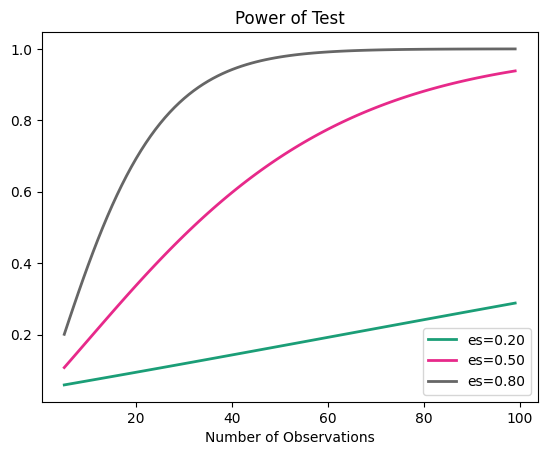

In [174]:
# Power curve
effect_sizes = np.array([0.2, 0.5, 0.8])
sample_sizes = np.array(range(5, 100))
  
# plot power curves
analysis.plot_power(dep_var='nobs', nobs=sample_sizes,
               effect_size=effect_sizes)
  
plt.show()

In [175]:
df2_fin['Age Group'].unique()

array(['Aged 35 to 44 years', 'Aged 17 years and under',
       'Aged 25 to 34 years', 'Aged 45 to 54 years',
       'Aged 55 to 64 years', 'Aged 18 to 24 years',
       'Aged 65 years and older'], dtype=object)

## RQ1: Logistics Regression

In [176]:
# select predictors:  perceived race and age group, negative action 
x = df2_fin[[ 'Perceived_Race', 'Age Group','Negative Action']].copy()
# Transforming the categorical variables to dummy variables
#x['Sex'] = pd.get_dummies(df2_fin.Sex, drop_first=True) # 1= male, 0 = female
Perceived_Race = pd.get_dummies(df2_fin.Perceived_Race, drop_first=True) # Setting Black as reference level -> Black = all 0 for all columns
Age_Group = pd.get_dummies(df2_fin['Age Group'])
Age_Group = Age_Group.drop('Aged 25 to 34 years', axis = 1) # Aged 25 to 34 years = 0 for all columns

# Rename the column headers
Perceived_Race = Perceived_Race.rename(columns={'East/Southeast Asian': 'East_or_Southeast_Asian',
                                                'Latino/Indigenous': 'Latino_or_Indigenous',
                                                'Middle-Eastern':'Middle_Eastern',
                                                'South Asian': "South_Asian",
                                                'Unknown or Legacy' : 'Unknown_or_Legacy'})
Age_Group = Age_Group.rename(columns={'Aged 17 years and under': 'Aged_17_years_and_under',
                                      'Aged 18 to 24 years': "Aged_18_to_24_years",
                                      'Aged 25 to 34 years': "Aged_25_to_34_years",
                                      'Aged 35 to 44 years': "Aged_35_to_44_years",
                                      'Aged 45 to 54 years': "Aged_45_to_54_years",
                                      'Aged 55 to 64 years': "Aged_55_to_64_years",
                                      'Aged 65 years and older': "Aged_65_years_and_older"})


x=x.rename(columns={'Negative Action':'Negative_Action'})



# Select the response column 
y = pd.get_dummies(df2_fin.StripSearch, drop_first=True) # 1 = being searched
# Y has 30261 obs for 0, and 3784 data for 1. Around 88.89% is non searched data, 11.11% is searched data.

# Rename the y column
y = y.rename(columns={1: "StripSearched"})

In [177]:
# Drop the dupicate columns
x.drop(['Age Group', 'Perceived_Race'], axis = 1, inplace = True)

# concat the variables
x = pd.concat([x, Perceived_Race, Age_Group], axis = 1)

# display the predictor table
x.head(15)

,Negative_Action,East_or_Southeast_Asian,Latino_or_Indigenous,Middle_Eastern,South_Asian,Unknown_or_Legacy,White,Aged_17_years_and_under,Aged_18_to_24_years,Aged_35_to_44_years,Aged_45_to_54_years,Aged_55_to_64_years,Aged_65_years_and_older
0,0,1,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,1,1,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,1,0,0
5,2,0,0,1,0,0,0,0,0,0,0,1,0
6,0,0,0,0,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,1,0,0,1,0,0,0
9,0,0,0,0,1,0,0,0,0,0,1,0,0


In [178]:
# Split data to training set and test set, the proportion for y in training set and test set are the same as the proportion in the orginal dataset
# in this case, there are 88.89% of zeros, and 11.11% of ones.
# set the seed to 15
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, stratify=y, random_state=78)

In [179]:
# Create the formula string 
all_columns = ' + '.join(x)
formula = "StripSearched ~ " + all_columns 
print("Formula: ", formula, "\n")

# Put the training predictors and responses into one DataFrame to be input into the model
trainingdata = pd.concat([x_train,y_train], axis = 1)

# Build the model
log_reg_1 = smf.logit(formula, 
                      data=trainingdata).fit()


Formula:  StripSearched ~ Negative_Action + East_or_Southeast_Asian + Latino_or_Indigenous + Middle_Eastern + South_Asian + Unknown_or_Legacy + White + Aged_17_years_and_under + Aged_18_to_24_years + Aged_35_to_44_years + Aged_45_to_54_years + Aged_55_to_64_years + Aged_65_years_and_older 

Optimization terminated successfully.
         Current function value: 0.325451
         Iterations 8


In [180]:
# get model summary
print(log_reg_1.summary())

                           Logit Regression Results                           
Dep. Variable:          StripSearched   No. Observations:                27234
Model:                          Logit   Df Residuals:                    27220
Method:                           MLE   Df Model:                           13
Date:                Sat, 15 Apr 2023   Pseudo R-squ.:                 0.06703
Time:                        01:31:21   Log-Likelihood:                -8863.3
converged:                       True   LL-Null:                       -9500.1
Covariance Type:            nonrobust   LLR p-value:                2.642e-264
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -1.9195      0.045    -42.831      0.000      -2.007      -1.832
Negative_Action             0.6365      0.025     25.119      0.000       0.587       0.686


In [181]:
#getting odds ratio by taking exponential of the coefficients above
np.exp(log_reg_1.params)

Intercept                 0.1467
Negative_Action           1.8898
East_or_Southeast_Asian   0.4008
Latino_or_Indigenous      0.5412
Middle_Eastern            0.3408
South_Asian               0.3788
Unknown_or_Legacy         0.4247
White                     0.9532
Aged_17_years_and_under   0.6313
Aged_18_to_24_years       1.1283
Aged_35_to_44_years       1.0333
Aged_45_to_54_years       0.8315
Aged_55_to_64_years       0.6510
Aged_65_years_and_older   0.2283
dtype: float64

In [182]:
# Getting the exponential of the 95% CI and OR
params = log_reg_1.params
conf = log_reg_1.conf_int()
conf['OR'] = params
conf.columns = ["Lower CI", "Upper CI", "OR"]
np.exp(conf)
# tips: if 1 is included in the exponential CI, then the associated level/variable is not significant -> fail to reject H0
# 1 is included in CI -> probability of success is not associated with the associated variable. 

,Lower CI,Upper CI,OR
Intercept,0.1343,0.1601,0.1467
Negative_Action,1.7982,1.9860,1.8898
East_or_Southeast_Asian,0.3304,0.4863,0.4008
Latino_or_Indigenous,0.4362,0.6716,0.5412
Middle_Eastern,0.2663,0.4362,0.3408
South_Asian,0.3032,0.4731,0.3788
Unknown_or_Legacy,0.3511,0.5137,0.4247
White,0.8714,1.0427,0.9532
Aged_17_years_and_under,0.5134,0.7762,0.6313
Aged_18_to_24_years,1.0076,1.2634,1.1283


In [183]:
# Predict responses 
pred_1 = log_reg_1.predict(x_test)

# 0.5 rounds to 0; 0.501 rounds to 1
prediction_1 = list(map(round, pred_1))


In [184]:
# Accuracy score
print('\nTest accuracy = ', accuracy_score(y_test, prediction_1))


Test accuracy =  0.8898516669114407


In [185]:
# Confusion matrix
# upper-left is true negative, lower-left is false negative, lower-right is true positive, upper-right false positive 
cm = confusion_matrix(y_test, prediction_1) 
print ("\nConfusion Matrix : \n", cm) 


Confusion Matrix : 
 [[6037   15]
 [ 735   22]]


### Prediction Interval



In [186]:
# Calculate the standard error of the predicted probabilities
se = np.sqrt(np.multiply(pred_1, 1-pred_1))

# Calculate the z-score = 1.96 for 95% confidence level
z = 1.96

# Calculate the lower and upper bounds of the prediction interval
lower = pred_1 - z*se
upper = pred_1 + z*se


# Create a DataFrame with the predicted probabilities, predictions, and prediction interval bounds
results = pd.DataFrame({'Predicted Value': pred_1,
                        'Prediction': prediction_1,
                        'Lower Bound': lower,
                        'Upper Bound': upper})

# Display the results
print(results.head())


       Predicted Value  Prediction  Lower Bound  Upper Bound
6384            0.1529           0      -0.5525       0.8582
6788            0.1262           0      -0.5247       0.7772
30475           0.0605           0      -0.4067       0.5276
24751           0.0573           0      -0.3981       0.5127
14057           0.0555           0      -0.3933       0.5044


In [187]:
#examine what percentage of target values in the test data were within the prediction intervals:
log_correct = np.mean(y_test['StripSearched'].between(results['Lower Bound'], results['Upper Bound']))
print(f"{log_correct:.2%} of the prediction intervals contain true target.")
     

90.84% of the prediction intervals contain true target.


### Model Assumption check
- The DV is categorical (binary)
- Independence of observations
- Independent variables (continuous variable) are linearly related to the log odds
- Multicillinearity

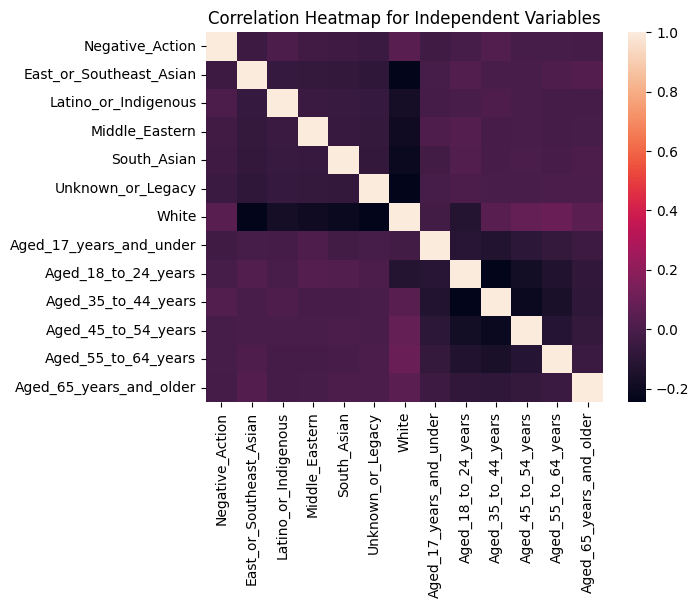

In [188]:
# Multicollinearity check
sns.heatmap(x.corr())  

# Add a title
plt.title("Correlation Heatmap for Independent Variables")

# Show the plot
plt.show()


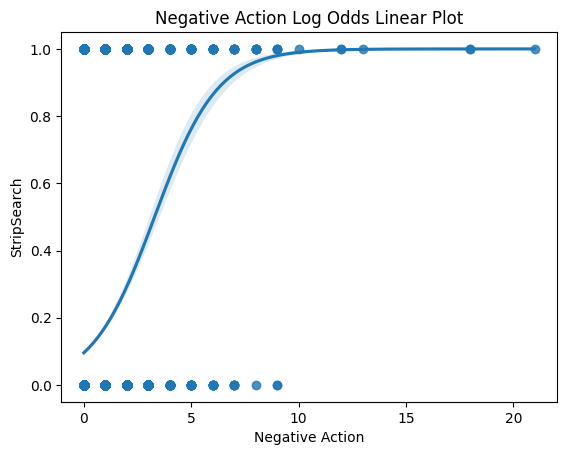

In [189]:
# Assumption of Continuous IVs being Linearly Related to the Log Odds
nact = sns.regplot(x= 'Negative Action', y= 'StripSearch', data= df2_fin, logistic= True).set_title("Negative Action Log Odds Linear Plot")
# S-shape -> assumption satisfies.

## RQ 2: ANCOVA 

In [190]:
!pip install pingouin
from pingouin import ancova
pd.options.display.max_columns = None #show all columns in data

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.6/198.6 kB 7.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7048 sha256=b8cf9d45162c07bd0e993c02acdf58ca7c1f6217e13689e0c36754a0dabdece7
  Stored in directory: /root/.cache/pip/wheels/04/bb/0d/2d02ec45f29c48d6192476bfb59c5a0e64b605e7212374dd15
Successfully built littleutils


In [191]:
#isolate columns of interest into a new df
df_1way = df2_fin[['StripSearchPercentage', 'Youth Status', 'Negative Action']].copy()

df_1way.head()

,StripSearchPercentage,Youth Status,Negative Action
0,0.0000,Not a youth,0
1,0.0000,Youth,0
2,0.0000,Not a youth,0
3,0.0000,Not a youth,0
4,0.0000,Not a youth,0


In [192]:
# fit an ancova model
ancova(data=df_1way, dv='StripSearchPercentage', covar='Negative Action', between='Youth Status')

,Source,SS,DF,F,p-unc,np2
0,Youth Status,6612.7110,1,11.3088,0.0008,0.0003
1,Negative Action,201465.2267,1,344.5375,0.0000,0.0100
2,Residual,19904588.1248,34040,NaN,NaN,NaN


### Assumption Check
ANCOVA

1) Continuous outcome variable

2) Categorical variables with more than two levels.

3) Independence of error.

4) Constant variance:
Levene’s test can be used to check the homogeneity of variances when the data is not drawn from a normal distribution.

5）Normality: Shapiro-Wilk test-> H0: data is drawn from normal distribution

6) Linearity assumption: At each level of categorical independent variable, the covariate should be linearly related to the dependent variable. If the relationship is not linear, the adjustment made to covariate will be biased.

7)Homogeneity of regression slopes (covariate coefficients)
i.e. the slope should be parallel

In [194]:
# rename column name
df2_fin = df2_fin.rename(columns={'Negative Action': 'Negative_Action',
                                  'Youth Status' :'Youth_Status'})

In [195]:
# build the ancova model
anvmod = ols ('StripSearchPercentage ~ Youth_Status + Negative_Action', data = df2_fin).fit()

In [196]:
# Constant variance check
stats.levene(youth['StripSearchPercentage'],nyou['StripSearchPercentage'],
             center = 'mean')
# p-value is less than 0.05 which means that we have strong evidence to reject the null hypothesis that the variance across groups is statistically significantly different.
# In other words, the assumption of constant variance does not satisfy.

LeveneResult(statistic=59.07972525672058, pvalue=1.5547188016747317e-14)

In [197]:
# Check normality assumption
w, pvalue = stats.shapiro(anvmod.resid)
print(w, pvalue)

# p-value less than 0.5, which represents the violation of normality assumption.
# but since the sample size is too big (N>5000), the result may be not accurate.

0.3850114345550537 0.0


/usr/local/lib/python3.9/dist-packages/scipy/stats/_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



In [199]:
# linearity check
# visulize the relationship between number of booked and negative action
fig = px.scatter(df2_fin, x="Negative_Action", y="StripSearchPercentage",
                 trendline="ols",
                 height = 600, width = 700)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b> Number of Negative Action vs. Percentage of Strip Searches </b>',
                  xaxis_title = "Number of Negative Action",
                  yaxis_title = "Percentage of Strip Searches (%)"
                  )

fig.show()
# not strong linear relationship between two variables, but general speaking, as number of negative action increases, the percentage would also increase.
# Assumption satisfies
# use this figure or model result below to explain the assumption.

In [200]:
# fit a linear model for perc of ss and negative action to see if there is linear relationship
linmod = ols('StripSearchPercentage ~ Negative_Action', data=df2_fin).fit()
linmod.summary()

# model summary shows that p-value for negative action is less than 0.05, which means we have evidence to reject the null hypothesis that the coefficient of negative action is zero
# In other words, there is linear relationship between perc of ss and negative action
# assumption of linearity satisfies.

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     StripSearchPercentage   R-squared:                       0.010
Model:                               OLS   Adj. R-squared:                  0.010
Method:                    Least Squares   F-statistic:                     349.0
Date:                   Sat, 15 Apr 2023   Prob (F-statistic):           1.72e-77
Time:                           01:33:43   Log-Likelihood:            -1.5676e+05
No. Observations:                  34043   AIC:                         3.135e+05
Df Residuals:                      34041   BIC:                         3.135e+05
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           7.0878      0.135     52.374      0.000       6.823       7.353
Negative_Action     3.9255      0.210     18.681      0.000       3.514       4.337
==============================================================================
Omnibus:                    21829.698   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           171676.881
Skew:                           3.196   Prob(JB):                         0.00
Kurtosis:                      11.953   Cond. No.                         1.67
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [203]:
# check homogenity of regression slopes
fig = px.scatter(df2_fin, x="Negative_Action", y="StripSearchPercentage", color="Youth_Status",
                 color_discrete_sequence= ['#B3A86A','#D4613E'],
                 trendline="ols",
                 height = 600, width = 700)

# Set the title in bold, and modified the x,y axes label
fig.update_layout(title='<b> Number of Negative Action vs. Percentage of Strip Searches </b>',
                  xaxis_title = "Number of Negative Action",
                  yaxis_title = "Percentage of Strip Searches (%)"
                  )

fig.show()
# Even though two lines are not perfectly parallel,there is no intersection between them. The assumption satisfies. 
# This may be caused by the small data points for youth groups. (Limitation)
# Use this figure or the result below to explain the assumption satisfication.

In [204]:
# interaction model
intmod = ols('StripSearchPercentage ~ Youth_Status * Negative_Action', data =df2_fin).fit()
intmod.summary()
# the p-value for interaction term is greater than 0.05, we have no evidence to reject the null hypothesis 
# there is no interaction effect between youth status and negative action
# thus the homogenity of regression slopes assumption satisfies.

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     StripSearchPercentage   R-squared:                       0.011
Model:                               OLS   Adj. R-squared:                  0.010
Method:                    Least Squares   F-statistic:                     121.2
Date:                   Sat, 15 Apr 2023   Prob (F-statistic):           4.25e-78
Time:                           01:34:02   Log-Likelihood:            -1.5675e+05
No. Observations:                  34043   AIC:                         3.135e+05
Df Residuals:                      34039   BIC:                         3.135e+05
Df Model:                              3                                         
Covariance Type:               nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                 7.1897      0.139     51.623      0.000       6.917       7.463
Youth_Status[T.Youth]                    -1.7122      0.589     -2.906      0.004      -2.867      -0.557
Negative_Action                           3.9510      0.212     18.640      0.000       3.536       4.366
Youth_Status[T.Youth]:Negative_Action    -2.9791      1.652     -1.803      0.071      -6.217       0.259
==============================================================================
Omnibus:                    21821.063   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           171514.009
Skew:                           3.195   Prob(JB):                         0.00
Kurtosis:                      11.949   Cond. No.                         12.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""